In [1]:
pip install segmentation-models-pytorch -q

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 7.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


# **1 - Importing required libraries**

In [2]:
import os
import csv
import random
import numpy as np
import pandas as pd
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset, random_split
from torchvision import transforms, models
from torchvision.transforms.functional import to_pil_image
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.notebook import tqdm

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
class Config:
    num_epochs = 30
    batch_size = 32

# **2 - Data Preprocessing**

In [5]:
dataset_path = "/kaggle/input/lgg-mri-segmentation/kaggle_3m"

patients = sorted(os.listdir(dataset_path))
num_patients = len(patients)
print(f"Total No. of patients: {num_patients}")

image_paths = []
mask_paths = []
image_shapes = []

for patient in patients:
    patient_dir = os.path.join(dataset_path, patient)
    
    if os.path.isdir(patient_dir):
        for file in os.listdir(patient_dir):
            file_path = os.path.join(patient_dir, file)
            if file.endswith(".tif") and "_mask" not in file:
                image_paths.append(file_path)
                
                
                mask_file = file.replace(".tif", "_mask.tif")
                mask_path = os.path.join(patient_dir, mask_file)
                if os.path.exists(mask_path):
                    mask_paths.append(mask_path)
                else:
                    mask_paths.append(None)
                
                img = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)
                if img is not None:
                    if len(img.shape) == 3:  
                        h, w, c = img.shape
                    else:  
                        h, w = img.shape
                        c = 1  
                    image_shapes.append((h, w, c))

df_shapes = pd.DataFrame(image_shapes, columns=["Height", "Width", "Channels"])
df_shapes_summary = df_shapes.describe()
print(df_shapes_summary)

Total No. of patients: 112
       Height   Width  Channels
count  3929.0  3929.0    3929.0
mean    256.0   256.0       3.0
std       0.0     0.0       0.0
min     256.0   256.0       3.0
25%     256.0   256.0       3.0
50%     256.0   256.0       3.0
75%     256.0   256.0       3.0
max     256.0   256.0       3.0


In [6]:
class BrainTumorSegmentationDataset(Dataset):

    def __init__(self,image_paths,mask_paths):
        self.image_paths = image_paths
        self.mask_paths = mask_paths

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self,idx):
        img_path =self.image_paths[idx]
        mask_path =self.mask_paths[idx]

        image=preprocess_image(img_path)
        mask=preprocess_mask(mask_path)

        return image, mask

transform_image = transforms.Compose([
    transforms.ToTensor()
])

def preprocess_image(image_path):
    img=cv2.imread(image_path,cv2.IMREAD_COLOR)
    img=cv2.resize(img,(256,256))
    img=transform_image(img)
    return img

def preprocess_mask(mask_path):
    mask=cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask=cv2.resize(mask, (256,256))
    mask=mask/255.0
    mask=torch.tensor(mask,dtype=torch.float32).unsqueeze(0)
    return mask

In [7]:

train_img_paths,temp_image_paths = train_test_split(image_paths, test_size=0.2, random_state=42)
train_mask_paths, temp_mask_paths = train_test_split(mask_paths, test_size=0.2, random_state=42)
val_img_paths, test_img_paths = train_test_split(temp_image_paths, test_size=0.25, random_state=42)
val_mask_paths, test_mask_paths = train_test_split(temp_mask_paths, test_size=0.25, random_state=42)

train_dataset = BrainTumorSegmentationDataset(train_img_paths, train_mask_paths)
val_dataset = BrainTumorSegmentationDataset(val_img_paths, val_mask_paths)
test_dataset = BrainTumorSegmentationDataset(test_img_paths, test_mask_paths)

train_loader = DataLoader(train_dataset, batch_size=Config.batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=Config.batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=Config.batch_size, shuffle=False)

print(f"Train set: {len(train_dataset)} images")
print(f"Validation set: {len(val_dataset)} images")
print(f"Test set: {len(test_dataset)} images")

Train set: 3143 images
Validation set: 589 images
Test set: 197 images


# **3 - U-Net Architecture**

In [8]:
class DoubleConv(nn.Module):

    def __init__(self,in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv =nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv(x)


class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(UNet, self).__init__()

        # Encoder
        self.enc1= DoubleConv(in_channels,64)
        self.enc2 = DoubleConv(64, 128)
        self.enc3 = DoubleConv(128, 256)
        self.enc4 = DoubleConv(256, 512)

        self.pool = nn.MaxPool2d(kernel_size=2,stride=2)

        # Bottleneck
        self.bottleneck = DoubleConv(512,1024)

        # Decoder (upsampling)
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)

        # Çıkış katmanı (Sigmoid çünkü binary segmentation)
        self.out_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool(enc1))
        enc3 = self.enc3(self.pool(enc2))
        enc4 = self.enc4(self.pool(enc3))

        # Bottleneck
        bottleneck = self.bottleneck(self.pool(enc4))

        # Decoder
        dec4 = self.up4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.dec4(dec4)

        dec3 = self.up3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.dec3(dec3)

        dec2 = self.up2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.dec2(dec2)

        dec1 = self.up1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.dec1(dec1)

        # output
        return self.out_conv(dec1)

In [9]:
model = UNet(in_channels=3, out_channels=1).to(device)
# BCE Loss ve Adam optimizer
loss_fn = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
# scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)
# Define ReduceLROnPlateau scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', patience=3, factor=0.5, verbose=True
)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


# **4 - Metrics Definitions**

In [10]:
def dice_coefficient(pred, target, smooth=1e-6):
    intersection = torch.sum(pred * target, dim=(1,2,3))
    union = torch.sum(pred, dim=(1,2,3)) + torch.sum(target, dim=(1,2,3))

    dice_score = (2. * intersection + smooth) / (union + smooth)
    dice_score[(intersection == 0) & (union != 0)] = 0
    
    return dice_score.mean()

def dice_loss(pred, target, smooth=1e-6):
    return 1 - dice_coefficient(pred, target, smooth)

def precision(preds, targets):

    targets = targets.float()

    tp = (preds * targets).sum(dim=(1,2,3))
    fp = (preds * (1 - targets)).sum(dim=(1,2,3))

    precision = tp / (tp + fp + 1e-8)
    return precision.mean().item()

def recall(preds, targets):

    targets = targets.float()

    tp = (preds * targets).sum(dim=(1,2,3))
    fn = ((1 - preds) * targets).sum(dim=(1,2,3))

    recall = tp / (tp + fn + 1e-8)
    return recall.mean().item()

def mIou(pred, target):
    
    target = target.float()

    intersection = (pred * target).sum(dim=(1,2,3))
    union = (pred + target).sum(dim=(1,2,3)) - intersection 

    iou = (intersection + 1e-8) / (union + 1e-8) 
    return iou.mean().item()

# **5 - Train - Validation - Test Functions**

In [11]:
val_losses = []
train_losses = []
total_training_time = 0

import time
def train_model(model, train_loader, val_loader, loss_fn, optimizer, scheduler, num_epochs, model_path, csv_name):
    global val_losses, train_losses, total_training_time   # Use the global lists

    # Clear the lists instead of reassigning them
    val_losses.clear()
    train_losses.clear()
    total_training_time = 0
    
    
    log_fields = ["epoch", "time", "train_loss", "val_loss", "train_precision", "val_precision", 
              "train_recall", "val_recall", "train_dice", "val_dice"]
   
   
    best_val_dice = 0
    
        # Initialize logging file
    with open(csv_name, 'w', newline='', encoding='utf-8') as csvfile:
         writer = csv.DictWriter(csvfile, fieldnames=log_fields)
         writer.writeheader()

    

    for epoch in range(num_epochs):
        start_time = time.time()
        model.train()
        train_loss = 0
        train_dice = 0
        train_precision = 0
        train_recall = 0
        train_mIoU = 0
        train_acc = 0
        
        
        train_iterator = tqdm(train_loader, desc=f"Epoch {epoch + 1}")
        for images, masks in train_iterator:
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, masks)
            

            loss.backward()
            optimizer.step()
            outputs_bin = (outputs >= 0.5).float()
    
            # Calculate metrics
            dice = dice_coefficient(outputs_bin, masks)
            precision_score = precision(outputs_bin, masks)
            recall_score = recall(outputs_bin, masks)
            miou_score = mIou(outputs_bin, masks)

            train_iterator.set_postfix({'loss': f"{loss :.4f}",})
        
            # Accumulate metrics
            train_loss += loss.item()
            train_dice += dice.item()
            train_mIoU += miou_score
            train_recall += recall_score
            train_precision += precision_score

        epoch_time = time.time() - start_time
        total_training_time += epoch_time
        
        train_loss /= len(train_loader)
        train_dice /= len(train_loader)
        train_mIoU /= len(train_loader)
        train_recall /= len(train_loader)
        train_precision /= len(train_loader)
        train_losses.append(train_loss)
        
        print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f} -Train Dice: {train_dice:.4f} - Train mIoU:{train_mIoU:.4f} -Train Recall: {train_recall:.4f} - Train Precision:{train_precision:.4f}")

        val_loss, val_dice, val_mIoU, val_recall, val_precision = valid_model(model,loss_fn,val_loader,device,epoch) 
        
        val_losses.append(val_loss)
        

        print(f"Epoch {epoch+1}/{num_epochs} - Val Loss: {val_loss:.4f} -Val Dice: {val_dice:.4f} - Val mIoU:{val_mIoU:.4f} -Val Recall: {val_recall:.4f} - Val Precision:{val_precision:.4f}")

        if val_dice > best_val_dice:
           best_val_dice = val_dice
           torch.save(model.state_dict(), model_path)
           print(f"Model saved at epoch {epoch+1} with dice: {best_val_dice:.4f}")


             # Log training and validation metrics
        with open(csv_name, 'a', newline='', encoding='utf-8') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=log_fields)
            writer.writerow({
                "epoch": epoch + 1,
                "time": round(epoch_time, 2),
                "train_loss": round(train_loss, 4),
                "val_loss": round(val_loss, 4),
                "train_precision": round(train_precision, 4),
                "val_precision": round(val_precision, 4),
                "train_recall": round(train_recall, 4),
                "val_recall": round(val_recall, 4),
                "train_dice": round(train_dice, 4),
                "val_dice": round(val_dice, 4),
                
            })

    print(f"Training Complete in {total_training_time:.4f}s with {total_training_time/num_epochs:.4f}s per epoch with Best_dice {best_val_dice:.4f}.")

In [12]:
def valid_model(model,loss_fn, dataloader, device, epoch):# Validation Loop
    val_loss = 0
    val_dice = 0
    val_precision = 0
    val_recall = 0
    val_mIoU = 0
    
        
    model.eval()
    with torch.no_grad():
        val_iterator = tqdm(dataloader, desc=f"Epoch {epoch + 1}")
        for images, masks in val_iterator:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            outputs_bin = (outputs >= 0.5).float()
            loss = loss_fn(outputs, masks)
            dice = dice_coefficient(outputs_bin, masks)
            precision_score = precision(outputs_bin, masks)
            recall_score = recall(outputs_bin, masks)
            miou_score = mIou(outputs_bin, masks)


            
            val_loss += loss.item()
            val_dice += dice.item()
            val_mIoU += miou_score
            val_recall += recall_score
            val_precision += precision_score
            val_iterator.set_postfix({'loss': f"{val_loss :.4f}",})

    
    val_loss /= len(dataloader)
    val_dice /= len(dataloader)
    val_mIoU /= len(dataloader)
    val_recall /= len(dataloader)
    val_precision /= len(dataloader)
    scheduler.step(val_loss)
    return val_loss, val_dice, val_mIoU, val_recall, val_precision

In [13]:
def inference_and_visualize(model, test_dataloader, num_samples, device, model_path):
    # Load the best model weights
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()  # Set to evaluation mode
    
    valid_images, valid_masks = [], []
    
    # Collect all images and masks that have at least some nonzero values in the mask
    with torch.no_grad():
        for images, true_masks in test_dataloader:
            for img, mask in zip(images, true_masks):
                if mask.sum() > 0:  # Check if mask has any positive value
                    valid_images.append(img)
                    valid_masks.append(mask)
    
    # If no valid image-mask pairs are found, return
    if len(valid_images) == 0:
        print("No images with non-empty masks found in the dataset.")
        return
    
    # Randomly select 'num_samples' images
    num_samples = min(num_samples, len(valid_images))
    indices = random.sample(range(len(valid_images)), num_samples)
    selected_images = [valid_images[i] for i in indices]
    selected_masks = [valid_masks[i] for i in indices]
    
    plt.figure(figsize=(15, num_samples * 3))
    
    with torch.no_grad():
        for idx, (image, true_mask) in enumerate(zip(selected_images, selected_masks)):
            image, true_mask = image.to(device).unsqueeze(0), true_mask.to(device).unsqueeze(0)
            
            # Get prediction
            predicted_mask = model(image)
            predicted_mask = torch.sigmoid(predicted_mask)
            predicted_mask = (predicted_mask > 0.5).float().cpu().squeeze(0)
            
            # Move to CPU for visualization
            image, true_mask = image.cpu().squeeze(0), true_mask.cpu().squeeze(0)
            
            plt.subplot(num_samples, 3, idx * 3 + 1)
            plt.imshow(to_pil_image(image), cmap="gray")
            plt.title("Original Image")
            plt.axis("off")
            
            plt.subplot(num_samples, 3, idx * 3 + 2)
            plt.imshow(true_mask.squeeze(0), cmap="gray")
            plt.title("Real Mask")
            plt.axis("off")
            
            plt.subplot(num_samples, 3, idx * 3 + 3)
            plt.imshow(predicted_mask.squeeze(0), cmap="gray")
            plt.title("Predicted Mask")
            plt.axis("off")
    
    plt.tight_layout()
    plt.show()

In [14]:
def plot_losses(train_losses, val_losses):
    """
    Plots training and validation loss over epochs.

    Parameters:
    - train_losses (list): List of training loss values per epoch.
    - val_losses (list): List of validation loss values per epoch.
    """
    plt.figure(figsize=(12, 5))

    # Train & Validation Loss 
    plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
    plt.plot(range(1, len(val_losses) + 1), val_losses, label='Val Loss', marker='o')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Train & Validation Loss")
    plt.legend()
    plt.show()

# **6 - Training U-Net with CE Loss**

Epoch 1:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 1/30 - Train Loss: 0.1948 -Train Dice: 0.6472 - Train mIoU:0.6278 -Train Recall: 0.0703 - Train Precision:0.1314


Epoch 1:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 1/30 - Val Loss: 0.0938 -Val Dice: 0.6840 - Val mIoU:0.6487 -Val Recall: 0.2140 - Val Precision:0.1686
Model saved at epoch 1 with dice: 0.6840


Epoch 2:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 2/30 - Train Loss: 0.0521 -Train Dice: 0.7536 - Train mIoU:0.7259 -Train Recall: 0.1275 - Train Precision:0.1875


Epoch 2:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 2/30 - Val Loss: 0.0552 -Val Dice: 0.6835 - Val mIoU:0.6524 -Val Recall: 0.1967 - Val Precision:0.1678


Epoch 3:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 3/30 - Train Loss: 0.0319 -Train Dice: 0.7712 - Train mIoU:0.7436 -Train Recall: 0.1396 - Train Precision:0.1897


Epoch 3:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 3/30 - Val Loss: 0.0280 -Val Dice: 0.7560 - Val mIoU:0.7248 -Val Recall: 0.1774 - Val Precision:0.2312
Model saved at epoch 3 with dice: 0.7560


Epoch 4:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 4/30 - Train Loss: 0.0243 -Train Dice: 0.7836 - Train mIoU:0.7553 -Train Recall: 0.1490 - Train Precision:0.2078


Epoch 4:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 4/30 - Val Loss: 0.0231 -Val Dice: 0.7896 - Val mIoU:0.7586 -Val Recall: 0.1808 - Val Precision:0.2308
Model saved at epoch 4 with dice: 0.7896


Epoch 5:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 5/30 - Train Loss: 0.0206 -Train Dice: 0.7878 - Train mIoU:0.7595 -Train Recall: 0.1551 - Train Precision:0.2110


Epoch 5:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 5/30 - Val Loss: 0.0198 -Val Dice: 0.7860 - Val mIoU:0.7575 -Val Recall: 0.1731 - Val Precision:0.2349


Epoch 6:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 6/30 - Train Loss: 0.0189 -Train Dice: 0.7900 - Train mIoU:0.7621 -Train Recall: 0.1537 - Train Precision:0.2104


Epoch 6:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 6/30 - Val Loss: 0.0224 -Val Dice: 0.7209 - Val mIoU:0.6999 -Val Recall: 0.0794 - Val Precision:0.1793


Epoch 7:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 7/30 - Train Loss: 0.0171 -Train Dice: 0.7918 - Train mIoU:0.7631 -Train Recall: 0.1664 - Train Precision:0.2216


Epoch 7:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 7/30 - Val Loss: 0.0177 -Val Dice: 0.8017 - Val mIoU:0.7698 -Val Recall: 0.2108 - Val Precision:0.2361
Model saved at epoch 7 with dice: 0.8017


Epoch 8:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 8/30 - Train Loss: 0.0159 -Train Dice: 0.8010 - Train mIoU:0.7733 -Train Recall: 0.1647 - Train Precision:0.2210


Epoch 8:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 8/30 - Val Loss: 0.0178 -Val Dice: 0.8006 - Val mIoU:0.7694 -Val Recall: 0.1680 - Val Precision:0.2419


Epoch 9:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 9/30 - Train Loss: 0.0153 -Train Dice: 0.8023 - Train mIoU:0.7737 -Train Recall: 0.1667 - Train Precision:0.2231


Epoch 9:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 9/30 - Val Loss: 0.0165 -Val Dice: 0.7706 - Val mIoU:0.7411 -Val Recall: 0.1377 - Val Precision:0.2446


Epoch 10:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 10/30 - Train Loss: 0.0148 -Train Dice: 0.8013 - Train mIoU:0.7714 -Train Recall: 0.1737 - Train Precision:0.2297


Epoch 10:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 10/30 - Val Loss: 0.0167 -Val Dice: 0.7831 - Val mIoU:0.7541 -Val Recall: 0.1461 - Val Precision:0.2378


Epoch 11:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 11/30 - Train Loss: 0.0142 -Train Dice: 0.8045 - Train mIoU:0.7743 -Train Recall: 0.1782 - Train Precision:0.2367


Epoch 11:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 11/30 - Val Loss: 0.0153 -Val Dice: 0.7870 - Val mIoU:0.7579 -Val Recall: 0.1912 - Val Precision:0.2523


Epoch 12:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 12/30 - Train Loss: 0.0131 -Train Dice: 0.8066 - Train mIoU:0.7761 -Train Recall: 0.1798 - Train Precision:0.2406


Epoch 12:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 12/30 - Val Loss: 0.0143 -Val Dice: 0.8017 - Val mIoU:0.7718 -Val Recall: 0.1692 - Val Precision:0.2525
Model saved at epoch 12 with dice: 0.8017


Epoch 13:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 13/30 - Train Loss: 0.0120 -Train Dice: 0.8202 - Train mIoU:0.7889 -Train Recall: 0.1906 - Train Precision:0.2456


Epoch 13:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 13/30 - Val Loss: 0.0146 -Val Dice: 0.7836 - Val mIoU:0.7522 -Val Recall: 0.1740 - Val Precision:0.2674


Epoch 14:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 14/30 - Train Loss: 0.0110 -Train Dice: 0.8290 - Train mIoU:0.7967 -Train Recall: 0.2029 - Train Precision:0.2592


Epoch 14:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 14/30 - Val Loss: 0.0115 -Val Dice: 0.8305 - Val mIoU:0.7967 -Val Recall: 0.1966 - Val Precision:0.2965
Model saved at epoch 14 with dice: 0.8305


Epoch 15:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 15/30 - Train Loss: 0.0111 -Train Dice: 0.8301 - Train mIoU:0.7973 -Train Recall: 0.2032 - Train Precision:0.2601


Epoch 15:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 15/30 - Val Loss: 0.0128 -Val Dice: 0.7932 - Val mIoU:0.7627 -Val Recall: 0.1677 - Val Precision:0.2633


Epoch 16:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 16/30 - Train Loss: 0.0115 -Train Dice: 0.8232 - Train mIoU:0.7902 -Train Recall: 0.1981 - Train Precision:0.2569


Epoch 16:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 16/30 - Val Loss: 0.0359 -Val Dice: 0.6569 - Val mIoU:0.6107 -Val Recall: 0.3232 - Val Precision:0.2162


Epoch 17:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 17/30 - Train Loss: 0.0108 -Train Dice: 0.8274 - Train mIoU:0.7942 -Train Recall: 0.2039 - Train Precision:0.2615


Epoch 17:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 17/30 - Val Loss: 0.0143 -Val Dice: 0.7987 - Val mIoU:0.7689 -Val Recall: 0.1629 - Val Precision:0.2631


Epoch 18:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 18/30 - Train Loss: 0.0099 -Train Dice: 0.8431 - Train mIoU:0.8096 -Train Recall: 0.2116 - Train Precision:0.2684


Epoch 18:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 18/30 - Val Loss: 0.0139 -Val Dice: 0.8081 - Val mIoU:0.7714 -Val Recall: 0.1584 - Val Precision:0.2839


Epoch 19:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 19/30 - Train Loss: 0.0087 -Train Dice: 0.8617 - Train mIoU:0.8274 -Train Recall: 0.2247 - Train Precision:0.2767


Epoch 19:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 19/30 - Val Loss: 0.0083 -Val Dice: 0.8755 - Val mIoU:0.8415 -Val Recall: 0.2419 - Val Precision:0.3114
Model saved at epoch 19 with dice: 0.8755


Epoch 20:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 20/30 - Train Loss: 0.0077 -Train Dice: 0.8807 - Train mIoU:0.8470 -Train Recall: 0.2379 - Train Precision:0.2846


Epoch 20:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 20/30 - Val Loss: 0.0108 -Val Dice: 0.8288 - Val mIoU:0.7924 -Val Recall: 0.1798 - Val Precision:0.3016


Epoch 21:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 21/30 - Train Loss: 0.0079 -Train Dice: 0.8729 - Train mIoU:0.8382 -Train Recall: 0.2396 - Train Precision:0.2873


Epoch 21:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 21/30 - Val Loss: 0.0093 -Val Dice: 0.8458 - Val mIoU:0.8099 -Val Recall: 0.2182 - Val Precision:0.3124


Epoch 22:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 22/30 - Train Loss: 0.0074 -Train Dice: 0.8818 - Train mIoU:0.8481 -Train Recall: 0.2404 - Train Precision:0.2867


Epoch 22:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 22/30 - Val Loss: 0.0081 -Val Dice: 0.8784 - Val mIoU:0.8407 -Val Recall: 0.2440 - Val Precision:0.3257
Model saved at epoch 22 with dice: 0.8784


Epoch 23:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 23/30 - Train Loss: 0.0072 -Train Dice: 0.8860 - Train mIoU:0.8522 -Train Recall: 0.2429 - Train Precision:0.2861


Epoch 23:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 23/30 - Val Loss: 0.0074 -Val Dice: 0.8871 - Val mIoU:0.8524 -Val Recall: 0.2710 - Val Precision:0.3163
Model saved at epoch 23 with dice: 0.8871


Epoch 24:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 24/30 - Train Loss: 0.0076 -Train Dice: 0.8800 - Train mIoU:0.8464 -Train Recall: 0.2382 - Train Precision:0.2848


Epoch 24:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 24/30 - Val Loss: 0.0092 -Val Dice: 0.8510 - Val mIoU:0.8164 -Val Recall: 0.2053 - Val Precision:0.3102


Epoch 25:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 25/30 - Train Loss: 0.0070 -Train Dice: 0.8901 - Train mIoU:0.8570 -Train Recall: 0.2465 - Train Precision:0.2868


Epoch 25:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 25/30 - Val Loss: 0.0077 -Val Dice: 0.8723 - Val mIoU:0.8350 -Val Recall: 0.2403 - Val Precision:0.3276


Epoch 26:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 26/30 - Train Loss: 0.0068 -Train Dice: 0.8900 - Train mIoU:0.8567 -Train Recall: 0.2461 - Train Precision:0.2893


Epoch 26:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 26/30 - Val Loss: 0.0072 -Val Dice: 0.8796 - Val mIoU:0.8427 -Val Recall: 0.2502 - Val Precision:0.3313


Epoch 27:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 27/30 - Train Loss: 0.0066 -Train Dice: 0.8931 - Train mIoU:0.8601 -Train Recall: 0.2510 - Train Precision:0.2932


Epoch 27:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 27/30 - Val Loss: 0.0076 -Val Dice: 0.8767 - Val mIoU:0.8406 -Val Recall: 0.2554 - Val Precision:0.3243


Epoch 28:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 28/30 - Train Loss: 0.0069 -Train Dice: 0.8841 - Train mIoU:0.8505 -Train Recall: 0.2452 - Train Precision:0.2926


Epoch 28:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 28/30 - Val Loss: 0.0085 -Val Dice: 0.8755 - Val mIoU:0.8386 -Val Recall: 0.2970 - Val Precision:0.3032


Epoch 29:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 29/30 - Train Loss: 0.0064 -Train Dice: 0.8967 - Train mIoU:0.8640 -Train Recall: 0.2554 - Train Precision:0.2959


Epoch 29:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 29/30 - Val Loss: 0.0070 -Val Dice: 0.8924 - Val mIoU:0.8583 -Val Recall: 0.2664 - Val Precision:0.3194
Model saved at epoch 29 with dice: 0.8924


Epoch 30:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 30/30 - Train Loss: 0.0063 -Train Dice: 0.8943 - Train mIoU:0.8615 -Train Recall: 0.2535 - Train Precision:0.2933


Epoch 30:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 30/30 - Val Loss: 0.0065 -Val Dice: 0.8977 - Val mIoU:0.8636 -Val Recall: 0.2774 - Val Precision:0.3250
Model saved at epoch 30 with dice: 0.8977
Training Complete in 2656.2740s with 88.5425s per epoch with Best_dice 0.8977.


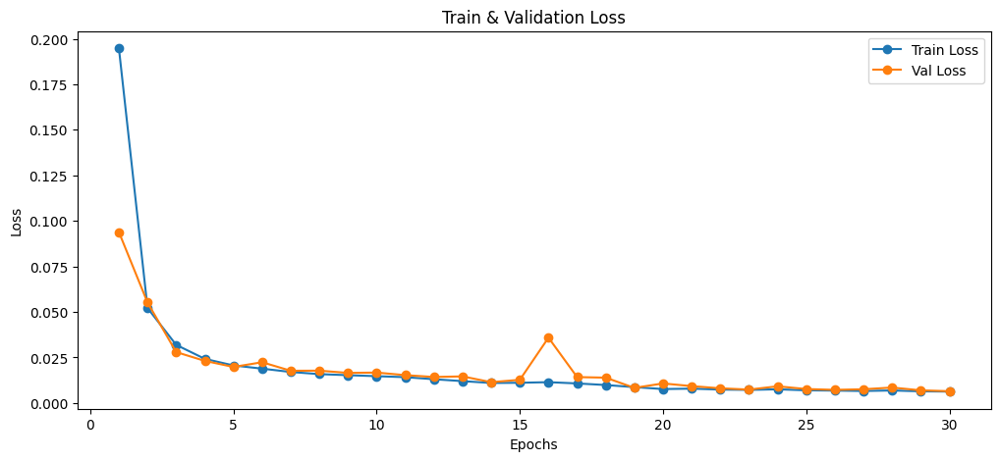

<ipython-input-13-7a0a50ea0c7c>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


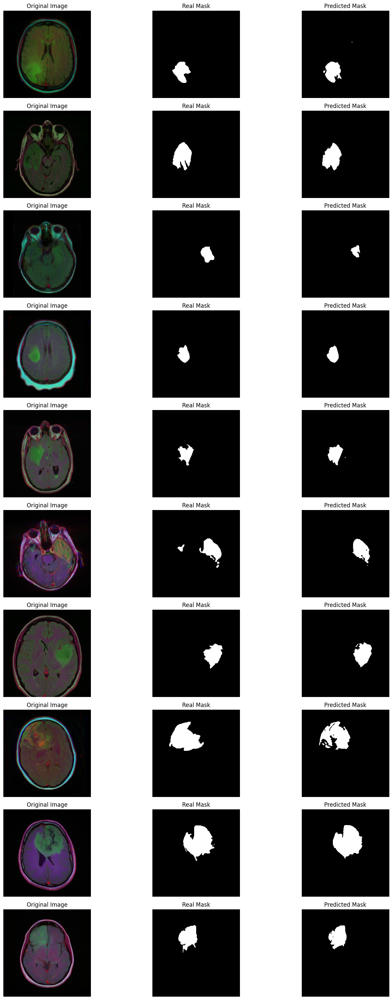

In [15]:
train_model(model, train_loader, val_loader, loss_fn, optimizer, scheduler, num_epochs = Config.num_epochs, model_path="best_model.pth", csv_name="training_results.csv")
plot_losses(train_losses, val_losses)
inference_and_visualize(model, test_loader, num_samples=10, device=device, model_path="/kaggle/working/best_model.pth")

In [16]:
torch.cuda.empty_cache()

In [17]:
# Hybrid Loss Func
class HybridLoss(nn.Module):
    def __init__(self, alpha=0.3, beta=0.7):
        super(HybridLoss, self).__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.alpha = alpha
        self.beta = beta

    def forward(self, pred, target):
        pred = torch.sigmoid(pred)
        bce_loss = self.bce(pred, target)
        intersection = (pred * target).sum()
        dice_loss = 1 - (2. * intersection + 1e-6) / (pred.sum() + target.sum() + 1e-6)
        return self.alpha * bce_loss + self.beta * dice_loss

# Modeli Create
# Modeli Create

loss_fn_hy = HybridLoss()
optimizer_hy = optim.Adam(model.parameters(), lr=0.001)
scheduler_hy= optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

# **7 - Training U-Net with Hybrid CE Loss**

Epoch 1:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 1/30 - Train Loss: 0.3781 -Train Dice: 0.8221 - Train mIoU:0.7905 -Train Recall: 0.2238 - Train Precision:0.2407


Epoch 1:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 1/30 - Val Loss: 0.3872 -Val Dice: 0.8151 - Val mIoU:0.7785 -Val Recall: 0.1859 - Val Precision:0.3066
Model saved at epoch 1 with dice: 0.8151


Epoch 2:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 2/30 - Train Loss: 0.3451 -Train Dice: 0.8395 - Train mIoU:0.8075 -Train Recall: 0.2364 - Train Precision:0.2531


Epoch 2:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 2/30 - Val Loss: 0.3591 -Val Dice: 0.8528 - Val mIoU:0.8169 -Val Recall: 0.2227 - Val Precision:0.2822
Model saved at epoch 2 with dice: 0.8528


Epoch 3:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 3/30 - Train Loss: 0.3372 -Train Dice: 0.8545 - Train mIoU:0.8220 -Train Recall: 0.2483 - Train Precision:0.2642


Epoch 3:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 3/30 - Val Loss: 0.3721 -Val Dice: 0.8322 - Val mIoU:0.7989 -Val Recall: 0.1987 - Val Precision:0.2763


Epoch 4:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 4/30 - Train Loss: 0.3184 -Train Dice: 0.8753 - Train mIoU:0.8447 -Train Recall: 0.2519 - Train Precision:0.2620


Epoch 4:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 4/30 - Val Loss: 0.3238 -Val Dice: 0.8430 - Val mIoU:0.8086 -Val Recall: 0.2992 - Val Precision:0.2780


Epoch 5:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 5/30 - Train Loss: 0.3249 -Train Dice: 0.8693 - Train mIoU:0.8393 -Train Recall: 0.2528 - Train Precision:0.2580


Epoch 5:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 5/30 - Val Loss: 0.3980 -Val Dice: 0.8152 - Val mIoU:0.7906 -Val Recall: 0.1818 - Val Precision:0.2408


Epoch 6:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 6/30 - Train Loss: 0.3396 -Train Dice: 0.8463 - Train mIoU:0.8167 -Train Recall: 0.2382 - Train Precision:0.2476


Epoch 6:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 6/30 - Val Loss: 0.3475 -Val Dice: 0.8486 - Val mIoU:0.8196 -Val Recall: 0.2175 - Val Precision:0.2549


Epoch 7:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 7/30 - Train Loss: 0.3229 -Train Dice: 0.8724 - Train mIoU:0.8431 -Train Recall: 0.2453 - Train Precision:0.2515


Epoch 7:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 7/30 - Val Loss: 0.3230 -Val Dice: 0.8630 - Val mIoU:0.8299 -Val Recall: 0.2510 - Val Precision:0.2976
Model saved at epoch 7 with dice: 0.8630


Epoch 8:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 8/30 - Train Loss: 0.3244 -Train Dice: 0.8710 - Train mIoU:0.8413 -Train Recall: 0.2490 - Train Precision:0.2545


Epoch 8:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 8/30 - Val Loss: 0.3142 -Val Dice: 0.8663 - Val mIoU:0.8352 -Val Recall: 0.2593 - Val Precision:0.2884
Model saved at epoch 8 with dice: 0.8663


Epoch 9:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 9/30 - Train Loss: 0.3123 -Train Dice: 0.8850 - Train mIoU:0.8562 -Train Recall: 0.2520 - Train Precision:0.2596


Epoch 9:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 9/30 - Val Loss: 0.3436 -Val Dice: 0.8597 - Val mIoU:0.8294 -Val Recall: 0.2281 - Val Precision:0.2728


Epoch 10:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 10/30 - Train Loss: 0.3105 -Train Dice: 0.8833 - Train mIoU:0.8550 -Train Recall: 0.2536 - Train Precision:0.2573


Epoch 10:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 10/30 - Val Loss: 0.3073 -Val Dice: 0.8682 - Val mIoU:0.8374 -Val Recall: 0.2857 - Val Precision:0.2723
Model saved at epoch 10 with dice: 0.8682


Epoch 11:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 11/30 - Train Loss: 0.3077 -Train Dice: 0.8837 - Train mIoU:0.8553 -Train Recall: 0.2580 - Train Precision:0.2640


Epoch 11:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 11/30 - Val Loss: 0.3232 -Val Dice: 0.8682 - Val mIoU:0.8364 -Val Recall: 0.2351 - Val Precision:0.2991
Model saved at epoch 11 with dice: 0.8682


Epoch 12:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 12/30 - Train Loss: 0.3026 -Train Dice: 0.8955 - Train mIoU:0.8661 -Train Recall: 0.2635 - Train Precision:0.2703


Epoch 12:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 12/30 - Val Loss: 0.2989 -Val Dice: 0.8872 - Val mIoU:0.8539 -Val Recall: 0.3157 - Val Precision:0.2880
Model saved at epoch 12 with dice: 0.8872


Epoch 13:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 13/30 - Train Loss: 0.2943 -Train Dice: 0.9006 - Train mIoU:0.8720 -Train Recall: 0.2655 - Train Precision:0.2723


Epoch 13:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 13/30 - Val Loss: 0.3163 -Val Dice: 0.8801 - Val mIoU:0.8491 -Val Recall: 0.2450 - Val Precision:0.2852


Epoch 14:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 14/30 - Train Loss: 0.3116 -Train Dice: 0.8750 - Train mIoU:0.8468 -Train Recall: 0.2531 - Train Precision:0.2589


Epoch 14:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 14/30 - Val Loss: 0.3086 -Val Dice: 0.8901 - Val mIoU:0.8571 -Val Recall: 0.2644 - Val Precision:0.3077
Model saved at epoch 14 with dice: 0.8901


Epoch 15:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 15/30 - Train Loss: 0.3223 -Train Dice: 0.8657 - Train mIoU:0.8364 -Train Recall: 0.2510 - Train Precision:0.2588


Epoch 15:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 15/30 - Val Loss: 0.3047 -Val Dice: 0.8731 - Val mIoU:0.8398 -Val Recall: 0.3001 - Val Precision:0.2736


Epoch 16:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 16/30 - Train Loss: 0.2948 -Train Dice: 0.8997 - Train mIoU:0.8706 -Train Recall: 0.2675 - Train Precision:0.2712


Epoch 16:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 16/30 - Val Loss: 0.2971 -Val Dice: 0.8852 - Val mIoU:0.8552 -Val Recall: 0.2743 - Val Precision:0.2928


Epoch 17:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 17/30 - Train Loss: 0.2935 -Train Dice: 0.9013 - Train mIoU:0.8735 -Train Recall: 0.2640 - Train Precision:0.2687


Epoch 17:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 17/30 - Val Loss: 0.3000 -Val Dice: 0.8890 - Val mIoU:0.8598 -Val Recall: 0.2556 - Val Precision:0.2926


Epoch 18:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 18/30 - Train Loss: 0.2874 -Train Dice: 0.9132 - Train mIoU:0.8854 -Train Recall: 0.2754 - Train Precision:0.2764


Epoch 18:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 18/30 - Val Loss: 0.2876 -Val Dice: 0.9038 - Val mIoU:0.8739 -Val Recall: 0.3011 - Val Precision:0.2981
Model saved at epoch 18 with dice: 0.9038


Epoch 19:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 19/30 - Train Loss: 0.2784 -Train Dice: 0.9207 - Train mIoU:0.8938 -Train Recall: 0.2763 - Train Precision:0.2798


Epoch 19:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 19/30 - Val Loss: 0.2850 -Val Dice: 0.9150 - Val mIoU:0.8837 -Val Recall: 0.2880 - Val Precision:0.3140
Model saved at epoch 19 with dice: 0.9150


Epoch 20:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 20/30 - Train Loss: 0.2765 -Train Dice: 0.9209 - Train mIoU:0.8938 -Train Recall: 0.2797 - Train Precision:0.2843


Epoch 20:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 20/30 - Val Loss: 0.2859 -Val Dice: 0.8969 - Val mIoU:0.8659 -Val Recall: 0.3034 - Val Precision:0.3099


Epoch 21:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 21/30 - Train Loss: 0.2744 -Train Dice: 0.9226 - Train mIoU:0.8963 -Train Recall: 0.2824 - Train Precision:0.2835


Epoch 21:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 21/30 - Val Loss: 0.2832 -Val Dice: 0.9117 - Val mIoU:0.8826 -Val Recall: 0.2852 - Val Precision:0.3119


Epoch 22:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 22/30 - Train Loss: 0.2734 -Train Dice: 0.9242 - Train mIoU:0.8981 -Train Recall: 0.2838 - Train Precision:0.2830


Epoch 22:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 22/30 - Val Loss: 0.2822 -Val Dice: 0.9133 - Val mIoU:0.8844 -Val Recall: 0.2963 - Val Precision:0.3001


Epoch 23:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 23/30 - Train Loss: 0.2837 -Train Dice: 0.9147 - Train mIoU:0.8879 -Train Recall: 0.2743 - Train Precision:0.2789


Epoch 23:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 23/30 - Val Loss: 0.2874 -Val Dice: 0.9092 - Val mIoU:0.8785 -Val Recall: 0.2922 - Val Precision:0.3067


Epoch 24:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 24/30 - Train Loss: 0.3009 -Train Dice: 0.8941 - Train mIoU:0.8658 -Train Recall: 0.2627 - Train Precision:0.2689


Epoch 24:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 24/30 - Val Loss: 0.3140 -Val Dice: 0.8638 - Val mIoU:0.8372 -Val Recall: 0.2374 - Val Precision:0.2721


Epoch 25:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 25/30 - Train Loss: 0.2911 -Train Dice: 0.9019 - Train mIoU:0.8748 -Train Recall: 0.2663 - Train Precision:0.2692


Epoch 25:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 25/30 - Val Loss: 0.3285 -Val Dice: 0.8441 - Val mIoU:0.8095 -Val Recall: 0.3021 - Val Precision:0.2808


Epoch 26:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 26/30 - Train Loss: 0.2854 -Train Dice: 0.9132 - Train mIoU:0.8859 -Train Recall: 0.2747 - Train Precision:0.2801


Epoch 26:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 26/30 - Val Loss: 0.2830 -Val Dice: 0.9177 - Val mIoU:0.8873 -Val Recall: 0.2972 - Val Precision:0.3062
Model saved at epoch 26 with dice: 0.9177


Epoch 27:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 27/30 - Train Loss: 0.2831 -Train Dice: 0.9140 - Train mIoU:0.8866 -Train Recall: 0.2755 - Train Precision:0.2763


Epoch 27:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 27/30 - Val Loss: 0.2792 -Val Dice: 0.9077 - Val mIoU:0.8781 -Val Recall: 0.3023 - Val Precision:0.3142


Epoch 28:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 28/30 - Train Loss: 0.2821 -Train Dice: 0.9116 - Train mIoU:0.8847 -Train Recall: 0.2791 - Train Precision:0.2803


Epoch 28:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 28/30 - Val Loss: 0.2809 -Val Dice: 0.9087 - Val mIoU:0.8796 -Val Recall: 0.3006 - Val Precision:0.3073


Epoch 29:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 29/30 - Train Loss: 0.2827 -Train Dice: 0.9188 - Train mIoU:0.8922 -Train Recall: 0.2820 - Train Precision:0.2849


Epoch 29:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 29/30 - Val Loss: 0.2893 -Val Dice: 0.8933 - Val mIoU:0.8641 -Val Recall: 0.2944 - Val Precision:0.3016


Epoch 30:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 30/30 - Train Loss: 0.2806 -Train Dice: 0.9273 - Train mIoU:0.9016 -Train Recall: 0.2810 - Train Precision:0.2825


Epoch 30:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 30/30 - Val Loss: 0.2878 -Val Dice: 0.9151 - Val mIoU:0.8848 -Val Recall: 0.2870 - Val Precision:0.3106
Training Complete in 2642.9005s with 88.0967s per epoch with Best_dice 0.9177.


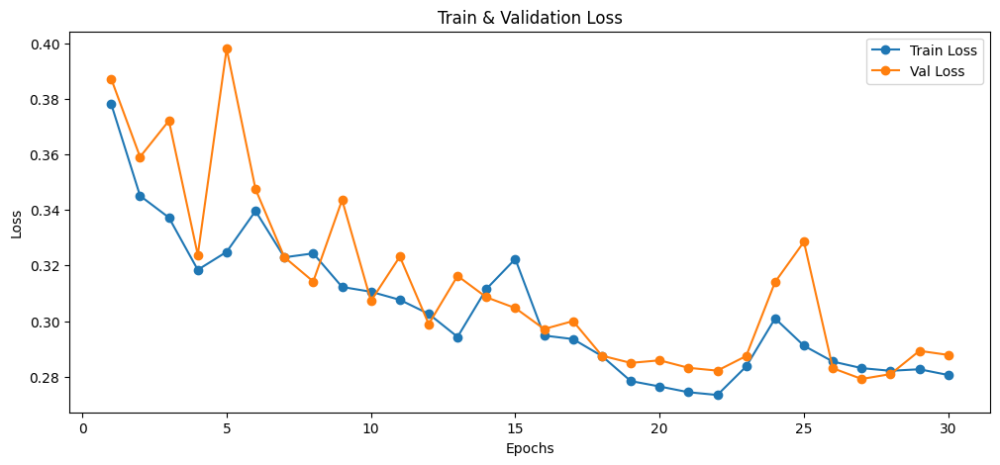

<ipython-input-13-7a0a50ea0c7c>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


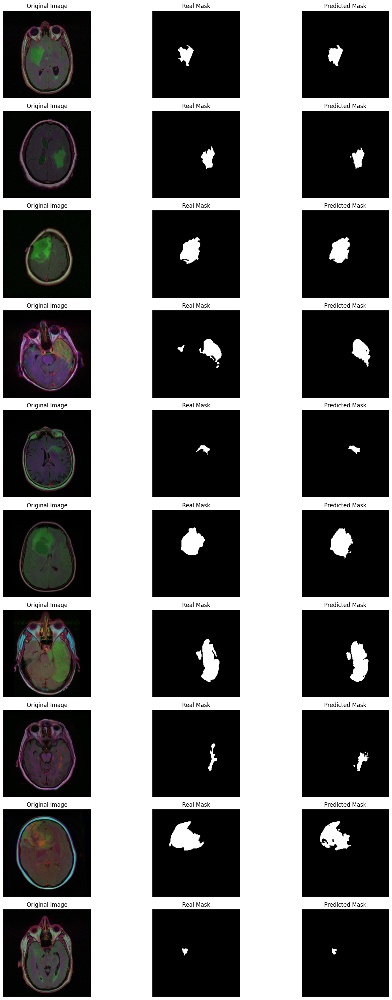

In [18]:
train_model(model, train_loader, val_loader, loss_fn_hy, optimizer_hy, scheduler_hy, num_epochs = Config.num_epochs, model_path="best_model_hy.pth", csv_name="training_results_hy.csv")
plot_losses(train_losses, val_losses)
inference_and_visualize(model, test_loader, num_samples=10, device=device, model_path="/kaggle/working/best_model_hy.pth")

# **8 - Importing U-Net and DeepLabV3+ Models**

In [19]:
import segmentation_models_pytorch as smp
# U-Net ve DeepLabV3+
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
unet_model = smp.Unet(
    encoder_name="resnet34",  
    encoder_weights="imagenet",  
    in_channels=3,  
    classes=1  
).to(device)

deeplabv3_model = smp.DeepLabV3Plus(
    encoder_name="resnet50",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1
).to(device)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 90.3MB/s]
Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 230MB/s]


# **9 - Training U-Net with ResNet backbone with Hybrid CE Loss**

Epoch 1:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 1/30 - Train Loss: 0.6700 -Train Dice: 0.6496 - Train mIoU:0.6153 -Train Recall: 0.2172 - Train Precision:0.1583


Epoch 1:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 1/30 - Val Loss: 0.4805 -Val Dice: 0.6786 - Val mIoU:0.6473 -Val Recall: 0.1889 - Val Precision:0.2130
Model saved at epoch 1 with dice: 0.6786


Epoch 2:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 2/30 - Train Loss: 0.3994 -Train Dice: 0.8112 - Train mIoU:0.7790 -Train Recall: 0.2097 - Train Precision:0.2229


Epoch 2:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 2/30 - Val Loss: 0.4452 -Val Dice: 0.5999 - Val mIoU:0.5602 -Val Recall: 0.2572 - Val Precision:0.2165


Epoch 3:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 3/30 - Train Loss: 0.3626 -Train Dice: 0.8325 - Train mIoU:0.8016 -Train Recall: 0.2222 - Train Precision:0.2400


Epoch 3:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 3/30 - Val Loss: 0.3328 -Val Dice: 0.8471 - Val mIoU:0.8165 -Val Recall: 0.2348 - Val Precision:0.2764
Model saved at epoch 3 with dice: 0.8471


Epoch 4:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 4/30 - Train Loss: 0.3374 -Train Dice: 0.8470 - Train mIoU:0.8162 -Train Recall: 0.2375 - Train Precision:0.2498


Epoch 4:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 4/30 - Val Loss: 0.3460 -Val Dice: 0.8525 - Val mIoU:0.8189 -Val Recall: 0.2408 - Val Precision:0.2702
Model saved at epoch 4 with dice: 0.8525


Epoch 5:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 5/30 - Train Loss: 0.3211 -Train Dice: 0.8694 - Train mIoU:0.8392 -Train Recall: 0.2476 - Train Precision:0.2563


Epoch 5:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 5/30 - Val Loss: 0.3346 -Val Dice: 0.8220 - Val mIoU:0.7885 -Val Recall: 0.2862 - Val Precision:0.2554


Epoch 6:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 6/30 - Train Loss: 0.3331 -Train Dice: 0.8457 - Train mIoU:0.8161 -Train Recall: 0.2354 - Train Precision:0.2475


Epoch 6:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 6/30 - Val Loss: 0.3338 -Val Dice: 0.8709 - Val mIoU:0.8358 -Val Recall: 0.2458 - Val Precision:0.2938
Model saved at epoch 6 with dice: 0.8709


Epoch 7:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 7/30 - Train Loss: 0.3213 -Train Dice: 0.8699 - Train mIoU:0.8412 -Train Recall: 0.2429 - Train Precision:0.2506


Epoch 7:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 7/30 - Val Loss: 0.3115 -Val Dice: 0.8664 - Val mIoU:0.8389 -Val Recall: 0.2489 - Val Precision:0.2787


Epoch 8:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 8/30 - Train Loss: 0.3062 -Train Dice: 0.8865 - Train mIoU:0.8576 -Train Recall: 0.2562 - Train Precision:0.2639


Epoch 8:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 8/30 - Val Loss: 0.3062 -Val Dice: 0.8728 - Val mIoU:0.8432 -Val Recall: 0.2630 - Val Precision:0.2880
Model saved at epoch 8 with dice: 0.8728


Epoch 9:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 9/30 - Train Loss: 0.3022 -Train Dice: 0.8908 - Train mIoU:0.8629 -Train Recall: 0.2605 - Train Precision:0.2671


Epoch 9:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 9/30 - Val Loss: 0.3405 -Val Dice: 0.7736 - Val mIoU:0.7378 -Val Recall: 0.3046 - Val Precision:0.2606


Epoch 10:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 10/30 - Train Loss: 0.3154 -Train Dice: 0.8744 - Train mIoU:0.8458 -Train Recall: 0.2509 - Train Precision:0.2604


Epoch 10:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 10/30 - Val Loss: 0.3031 -Val Dice: 0.8790 - Val mIoU:0.8522 -Val Recall: 0.2586 - Val Precision:0.2796
Model saved at epoch 10 with dice: 0.8790


Epoch 11:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 11/30 - Train Loss: 0.2975 -Train Dice: 0.8982 - Train mIoU:0.8706 -Train Recall: 0.2621 - Train Precision:0.2664


Epoch 11:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 11/30 - Val Loss: 0.2883 -Val Dice: 0.8922 - Val mIoU:0.8651 -Val Recall: 0.2837 - Val Precision:0.2824
Model saved at epoch 11 with dice: 0.8922


Epoch 12:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 12/30 - Train Loss: 0.2847 -Train Dice: 0.9139 - Train mIoU:0.8868 -Train Recall: 0.2725 - Train Precision:0.2734


Epoch 12:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 12/30 - Val Loss: 0.2873 -Val Dice: 0.8966 - Val mIoU:0.8701 -Val Recall: 0.2752 - Val Precision:0.2889
Model saved at epoch 12 with dice: 0.8966


Epoch 13:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 13/30 - Train Loss: 0.3030 -Train Dice: 0.8900 - Train mIoU:0.8621 -Train Recall: 0.2647 - Train Precision:0.2688


Epoch 13:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 13/30 - Val Loss: 0.2967 -Val Dice: 0.8900 - Val mIoU:0.8599 -Val Recall: 0.2749 - Val Precision:0.2959


Epoch 14:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 14/30 - Train Loss: 0.2949 -Train Dice: 0.8981 - Train mIoU:0.8705 -Train Recall: 0.2643 - Train Precision:0.2688


Epoch 14:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 14/30 - Val Loss: 0.2916 -Val Dice: 0.8942 - Val mIoU:0.8657 -Val Recall: 0.2828 - Val Precision:0.3082


Epoch 15:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 15/30 - Train Loss: 0.2807 -Train Dice: 0.9118 - Train mIoU:0.8853 -Train Recall: 0.2751 - Train Precision:0.2768


Epoch 15:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 15/30 - Val Loss: 0.2856 -Val Dice: 0.9026 - Val mIoU:0.8745 -Val Recall: 0.2967 - Val Precision:0.2998
Model saved at epoch 15 with dice: 0.9026


Epoch 16:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 16/30 - Train Loss: 0.2897 -Train Dice: 0.9014 - Train mIoU:0.8749 -Train Recall: 0.2695 - Train Precision:0.2738


Epoch 16:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 16/30 - Val Loss: 0.3227 -Val Dice: 0.8577 - Val mIoU:0.8296 -Val Recall: 0.2555 - Val Precision:0.2551


Epoch 17:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 17/30 - Train Loss: 0.2961 -Train Dice: 0.8944 - Train mIoU:0.8687 -Train Recall: 0.2582 - Train Precision:0.2636


Epoch 17:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 17/30 - Val Loss: 0.3072 -Val Dice: 0.8709 - Val mIoU:0.8400 -Val Recall: 0.2925 - Val Precision:0.2709


Epoch 18:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 18/30 - Train Loss: 0.2983 -Train Dice: 0.8983 - Train mIoU:0.8708 -Train Recall: 0.2674 - Train Precision:0.2744


Epoch 18:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 18/30 - Val Loss: 0.3411 -Val Dice: 0.8593 - Val mIoU:0.8328 -Val Recall: 0.2284 - Val Precision:0.2653


Epoch 19:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 19/30 - Train Loss: 0.2885 -Train Dice: 0.9086 - Train mIoU:0.8823 -Train Recall: 0.2681 - Train Precision:0.2717


Epoch 19:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 19/30 - Val Loss: 0.2943 -Val Dice: 0.8877 - Val mIoU:0.8621 -Val Recall: 0.2652 - Val Precision:0.2737


Epoch 20:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 20/30 - Train Loss: 0.2863 -Train Dice: 0.9091 - Train mIoU:0.8829 -Train Recall: 0.2702 - Train Precision:0.2711


Epoch 20:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 20/30 - Val Loss: 0.2830 -Val Dice: 0.8986 - Val mIoU:0.8704 -Val Recall: 0.2921 - Val Precision:0.2983


Epoch 21:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 21/30 - Train Loss: 0.2742 -Train Dice: 0.9275 - Train mIoU:0.9013 -Train Recall: 0.2810 - Train Precision:0.2845


Epoch 21:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 21/30 - Val Loss: 0.2807 -Val Dice: 0.9031 - Val mIoU:0.8762 -Val Recall: 0.2868 - Val Precision:0.3025
Model saved at epoch 21 with dice: 0.9031


Epoch 22:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 22/30 - Train Loss: 0.2744 -Train Dice: 0.9258 - Train mIoU:0.8996 -Train Recall: 0.2834 - Train Precision:0.2879


Epoch 22:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 22/30 - Val Loss: 0.2881 -Val Dice: 0.9081 - Val mIoU:0.8774 -Val Recall: 0.2811 - Val Precision:0.3158
Model saved at epoch 22 with dice: 0.9081


Epoch 23:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 23/30 - Train Loss: 0.2756 -Train Dice: 0.9269 - Train mIoU:0.9007 -Train Recall: 0.2808 - Train Precision:0.2879


Epoch 23:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 23/30 - Val Loss: 0.2880 -Val Dice: 0.9015 - Val mIoU:0.8734 -Val Recall: 0.3007 - Val Precision:0.2882


Epoch 24:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 24/30 - Train Loss: 0.2762 -Train Dice: 0.9229 - Train mIoU:0.8971 -Train Recall: 0.2824 - Train Precision:0.2843


Epoch 24:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 24/30 - Val Loss: 0.2832 -Val Dice: 0.8888 - Val mIoU:0.8630 -Val Recall: 0.2864 - Val Precision:0.2916


Epoch 25:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 25/30 - Train Loss: 0.2701 -Train Dice: 0.9248 - Train mIoU:0.8996 -Train Recall: 0.2851 - Train Precision:0.2889


Epoch 25:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 25/30 - Val Loss: 0.2838 -Val Dice: 0.9108 - Val mIoU:0.8832 -Val Recall: 0.2800 - Val Precision:0.3126
Model saved at epoch 25 with dice: 0.9108


Epoch 26:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 26/30 - Train Loss: 0.2705 -Train Dice: 0.9282 - Train mIoU:0.9031 -Train Recall: 0.2826 - Train Precision:0.2893


Epoch 26:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 26/30 - Val Loss: 0.2779 -Val Dice: 0.9110 - Val mIoU:0.8818 -Val Recall: 0.3032 - Val Precision:0.3172
Model saved at epoch 26 with dice: 0.9110


Epoch 27:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 27/30 - Train Loss: 0.2727 -Train Dice: 0.9261 - Train mIoU:0.9014 -Train Recall: 0.2792 - Train Precision:0.2851


Epoch 27:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 27/30 - Val Loss: 0.2808 -Val Dice: 0.9124 - Val mIoU:0.8843 -Val Recall: 0.3067 - Val Precision:0.2984
Model saved at epoch 27 with dice: 0.9124


Epoch 28:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 28/30 - Train Loss: 0.2684 -Train Dice: 0.9289 - Train mIoU:0.9040 -Train Recall: 0.2867 - Train Precision:0.2907


Epoch 28:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 28/30 - Val Loss: 0.2785 -Val Dice: 0.9110 - Val mIoU:0.8839 -Val Recall: 0.2996 - Val Precision:0.3093


Epoch 29:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 29/30 - Train Loss: 0.2738 -Train Dice: 0.9275 - Train mIoU:0.9023 -Train Recall: 0.2820 - Train Precision:0.2839


Epoch 29:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 29/30 - Val Loss: 0.2830 -Val Dice: 0.9006 - Val mIoU:0.8743 -Val Recall: 0.2868 - Val Precision:0.2890


Epoch 30:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 30/30 - Train Loss: 0.2702 -Train Dice: 0.9272 - Train mIoU:0.9027 -Train Recall: 0.2841 - Train Precision:0.2859


Epoch 30:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 30/30 - Val Loss: 0.2780 -Val Dice: 0.9134 - Val mIoU:0.8867 -Val Recall: 0.2906 - Val Precision:0.3055
Model saved at epoch 30 with dice: 0.9134
Training Complete in 925.4494s with 30.8483s per epoch with Best_dice 0.9134.


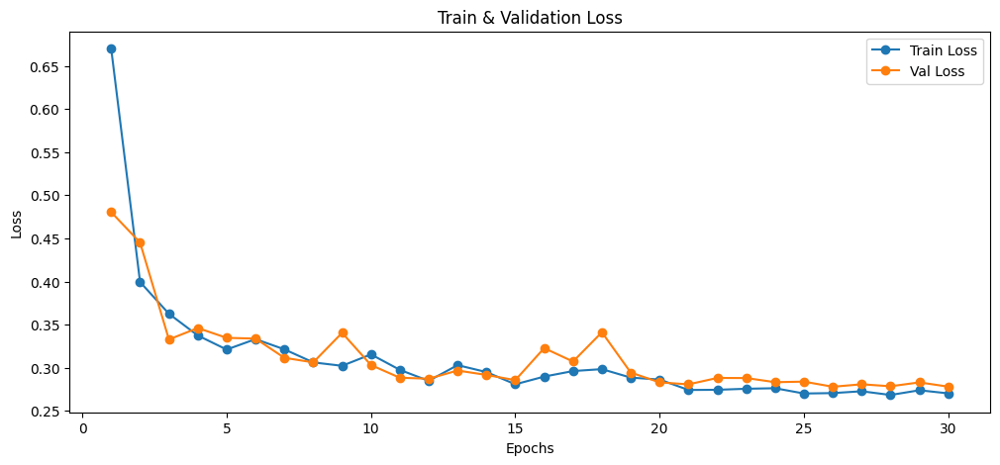

<ipython-input-13-7a0a50ea0c7c>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


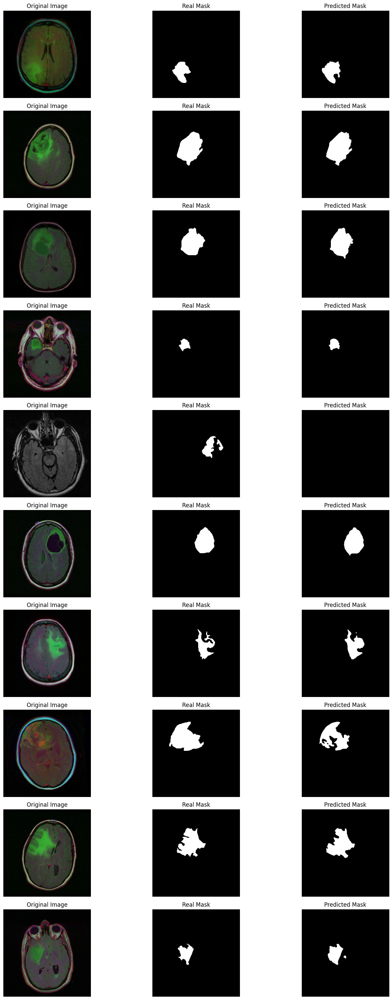

In [20]:
optimizer_unet = optim.Adam(unet_model.parameters(), lr=0.001)
train_model(unet_model, train_loader, val_loader, loss_fn_hy, optimizer_unet, scheduler_hy, num_epochs = Config.num_epochs, model_path="best_model_unet.pth", csv_name="training_results_unet.csv")
plot_losses(train_losses, val_losses)
inference_and_visualize(unet_model, test_loader, num_samples=10, device=device, model_path="/kaggle/working/best_model_unet.pth")

# **10 - Training DeepLabV3+ with Hybrid CE Loss**


Epoch 1:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 1/30 - Train Loss: 0.6167 -Train Dice: 0.7153 - Train mIoU:0.6836 -Train Recall: 0.1986 - Train Precision:0.1430


Epoch 1:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 1/30 - Val Loss: 0.4448 -Val Dice: 0.7480 - Val mIoU:0.7106 -Val Recall: 0.2385 - Val Precision:0.2001
Model saved at epoch 1 with dice: 0.7480


Epoch 2:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 2/30 - Train Loss: 0.4174 -Train Dice: 0.8012 - Train mIoU:0.7715 -Train Recall: 0.1928 - Train Precision:0.2001


Epoch 2:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 2/30 - Val Loss: 0.3916 -Val Dice: 0.8180 - Val mIoU:0.7815 -Val Recall: 0.2493 - Val Precision:0.2183
Model saved at epoch 2 with dice: 0.8180


Epoch 3:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 3/30 - Train Loss: 0.3818 -Train Dice: 0.8235 - Train mIoU:0.7942 -Train Recall: 0.2068 - Train Precision:0.2197


Epoch 3:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 3/30 - Val Loss: 0.3681 -Val Dice: 0.8320 - Val mIoU:0.7982 -Val Recall: 0.2357 - Val Precision:0.2496
Model saved at epoch 3 with dice: 0.8320


Epoch 4:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 4/30 - Train Loss: 0.3584 -Train Dice: 0.8416 - Train mIoU:0.8110 -Train Recall: 0.2242 - Train Precision:0.2398


Epoch 4:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 4/30 - Val Loss: 0.3464 -Val Dice: 0.8287 - Val mIoU:0.7938 -Val Recall: 0.2756 - Val Precision:0.2508


Epoch 5:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 5/30 - Train Loss: 0.3410 -Train Dice: 0.8527 - Train mIoU:0.8234 -Train Recall: 0.2279 - Train Precision:0.2383


Epoch 5:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 5/30 - Val Loss: 0.3293 -Val Dice: 0.8588 - Val mIoU:0.8267 -Val Recall: 0.2505 - Val Precision:0.2731
Model saved at epoch 5 with dice: 0.8588


Epoch 6:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 6/30 - Train Loss: 0.3229 -Train Dice: 0.8718 - Train mIoU:0.8426 -Train Recall: 0.2411 - Train Precision:0.2522


Epoch 6:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 6/30 - Val Loss: 0.3242 -Val Dice: 0.8636 - Val mIoU:0.8304 -Val Recall: 0.2828 - Val Precision:0.2534
Model saved at epoch 6 with dice: 0.8636


Epoch 7:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 7/30 - Train Loss: 0.3248 -Train Dice: 0.8622 - Train mIoU:0.8324 -Train Recall: 0.2393 - Train Precision:0.2551


Epoch 7:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 7/30 - Val Loss: 0.3835 -Val Dice: 0.7650 - Val mIoU:0.7254 -Val Recall: 0.2982 - Val Precision:0.2369


Epoch 8:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 8/30 - Train Loss: 0.3195 -Train Dice: 0.8762 - Train mIoU:0.8455 -Train Recall: 0.2482 - Train Precision:0.2592


Epoch 8:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 8/30 - Val Loss: 0.3058 -Val Dice: 0.8485 - Val mIoU:0.8150 -Val Recall: 0.2974 - Val Precision:0.2950


Epoch 9:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 9/30 - Train Loss: 0.3091 -Train Dice: 0.8811 - Train mIoU:0.8515 -Train Recall: 0.2531 - Train Precision:0.2677


Epoch 9:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 9/30 - Val Loss: 0.3088 -Val Dice: 0.8773 - Val mIoU:0.8471 -Val Recall: 0.2720 - Val Precision:0.2742
Model saved at epoch 9 with dice: 0.8773


Epoch 10:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 10/30 - Train Loss: 0.2946 -Train Dice: 0.9035 - Train mIoU:0.8746 -Train Recall: 0.2641 - Train Precision:0.2739


Epoch 10:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 10/30 - Val Loss: 0.3114 -Val Dice: 0.8841 - Val mIoU:0.8516 -Val Recall: 0.2692 - Val Precision:0.3095
Model saved at epoch 10 with dice: 0.8841


Epoch 11:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 11/30 - Train Loss: 0.2896 -Train Dice: 0.9104 - Train mIoU:0.8817 -Train Recall: 0.2679 - Train Precision:0.2781


Epoch 11:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 11/30 - Val Loss: 0.2952 -Val Dice: 0.8914 - Val mIoU:0.8591 -Val Recall: 0.2922 - Val Precision:0.3055
Model saved at epoch 11 with dice: 0.8914


Epoch 12:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 12/30 - Train Loss: 0.2976 -Train Dice: 0.9059 - Train mIoU:0.8774 -Train Recall: 0.2649 - Train Precision:0.2740


Epoch 12:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 12/30 - Val Loss: 0.3964 -Val Dice: 0.7656 - Val mIoU:0.7320 -Val Recall: 0.2147 - Val Precision:0.2478


Epoch 13:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 13/30 - Train Loss: 0.3244 -Train Dice: 0.8675 - Train mIoU:0.8384 -Train Recall: 0.2444 - Train Precision:0.2588


Epoch 13:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 13/30 - Val Loss: 0.2999 -Val Dice: 0.8957 - Val mIoU:0.8633 -Val Recall: 0.2835 - Val Precision:0.2993
Model saved at epoch 13 with dice: 0.8957


Epoch 14:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 14/30 - Train Loss: 0.3028 -Train Dice: 0.8929 - Train mIoU:0.8636 -Train Recall: 0.2657 - Train Precision:0.2749


Epoch 14:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 14/30 - Val Loss: 0.2944 -Val Dice: 0.8890 - Val mIoU:0.8570 -Val Recall: 0.2870 - Val Precision:0.3102


Epoch 15:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 15/30 - Train Loss: 0.2909 -Train Dice: 0.9111 - Train mIoU:0.8823 -Train Recall: 0.2724 - Train Precision:0.2798


Epoch 15:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 15/30 - Val Loss: 0.2863 -Val Dice: 0.9067 - Val mIoU:0.8765 -Val Recall: 0.2906 - Val Precision:0.3013
Model saved at epoch 15 with dice: 0.9067


Epoch 16:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 16/30 - Train Loss: 0.2861 -Train Dice: 0.9113 - Train mIoU:0.8834 -Train Recall: 0.2705 - Train Precision:0.2795


Epoch 16:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 16/30 - Val Loss: 0.2833 -Val Dice: 0.9023 - Val mIoU:0.8738 -Val Recall: 0.2856 - Val Precision:0.3009


Epoch 17:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 17/30 - Train Loss: 0.2915 -Train Dice: 0.9030 - Train mIoU:0.8758 -Train Recall: 0.2646 - Train Precision:0.2787


Epoch 17:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 17/30 - Val Loss: 0.3204 -Val Dice: 0.8667 - Val mIoU:0.8370 -Val Recall: 0.2607 - Val Precision:0.2695


Epoch 18:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 18/30 - Train Loss: 0.2956 -Train Dice: 0.9006 - Train mIoU:0.8728 -Train Recall: 0.2628 - Train Precision:0.2730


Epoch 18:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 18/30 - Val Loss: 0.3001 -Val Dice: 0.8640 - Val mIoU:0.8328 -Val Recall: 0.2944 - Val Precision:0.2949


Epoch 19:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 19/30 - Train Loss: 0.2980 -Train Dice: 0.8999 - Train mIoU:0.8727 -Train Recall: 0.2655 - Train Precision:0.2747


Epoch 19:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 19/30 - Val Loss: 0.2862 -Val Dice: 0.9063 - Val mIoU:0.8765 -Val Recall: 0.2923 - Val Precision:0.3001


Epoch 20:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 20/30 - Train Loss: 0.2918 -Train Dice: 0.9027 - Train mIoU:0.8751 -Train Recall: 0.2666 - Train Precision:0.2759


Epoch 20:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 20/30 - Val Loss: 0.2933 -Val Dice: 0.8992 - Val mIoU:0.8686 -Val Recall: 0.2663 - Val Precision:0.3065


Epoch 21:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 21/30 - Train Loss: 0.2797 -Train Dice: 0.9162 - Train mIoU:0.8893 -Train Recall: 0.2765 - Train Precision:0.2866


Epoch 21:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 21/30 - Val Loss: 0.2868 -Val Dice: 0.8845 - Val mIoU:0.8541 -Val Recall: 0.2897 - Val Precision:0.3077


Epoch 22:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 22/30 - Train Loss: 0.2787 -Train Dice: 0.9205 - Train mIoU:0.8934 -Train Recall: 0.2770 - Train Precision:0.2878


Epoch 22:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 22/30 - Val Loss: 0.2806 -Val Dice: 0.9139 - Val mIoU:0.8830 -Val Recall: 0.3109 - Val Precision:0.3044
Model saved at epoch 22 with dice: 0.9139


Epoch 23:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 23/30 - Train Loss: 0.2893 -Train Dice: 0.9089 - Train mIoU:0.8817 -Train Recall: 0.2701 - Train Precision:0.2765


Epoch 23:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 23/30 - Val Loss: 0.2887 -Val Dice: 0.9001 - Val mIoU:0.8684 -Val Recall: 0.2984 - Val Precision:0.2989


Epoch 24:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 24/30 - Train Loss: 0.2824 -Train Dice: 0.9145 - Train mIoU:0.8873 -Train Recall: 0.2750 - Train Precision:0.2806


Epoch 24:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 24/30 - Val Loss: 0.2812 -Val Dice: 0.9055 - Val mIoU:0.8767 -Val Recall: 0.2898 - Val Precision:0.3088


Epoch 25:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 25/30 - Train Loss: 0.2911 -Train Dice: 0.9100 - Train mIoU:0.8834 -Train Recall: 0.2692 - Train Precision:0.2771


Epoch 25:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 25/30 - Val Loss: 0.3186 -Val Dice: 0.8139 - Val mIoU:0.7801 -Val Recall: 0.2805 - Val Precision:0.2993


Epoch 26:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 26/30 - Train Loss: 0.2834 -Train Dice: 0.9111 - Train mIoU:0.8833 -Train Recall: 0.2769 - Train Precision:0.2831


Epoch 26:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 26/30 - Val Loss: 0.2903 -Val Dice: 0.9028 - Val mIoU:0.8726 -Val Recall: 0.2718 - Val Precision:0.3140


Epoch 27:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 27/30 - Train Loss: 0.2730 -Train Dice: 0.9251 - Train mIoU:0.8990 -Train Recall: 0.2799 - Train Precision:0.2868


Epoch 27:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 27/30 - Val Loss: 0.2800 -Val Dice: 0.9115 - Val mIoU:0.8802 -Val Recall: 0.3040 - Val Precision:0.3217


Epoch 28:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 28/30 - Train Loss: 0.2746 -Train Dice: 0.9257 - Train mIoU:0.9000 -Train Recall: 0.2812 - Train Precision:0.2883


Epoch 28:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 28/30 - Val Loss: 0.2936 -Val Dice: 0.9007 - Val mIoU:0.8711 -Val Recall: 0.2702 - Val Precision:0.3142


Epoch 29:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 29/30 - Train Loss: 0.2926 -Train Dice: 0.8977 - Train mIoU:0.8707 -Train Recall: 0.2624 - Train Precision:0.2738


Epoch 29:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 29/30 - Val Loss: 0.2882 -Val Dice: 0.8947 - Val mIoU:0.8660 -Val Recall: 0.2892 - Val Precision:0.2947


Epoch 30:   0%|          | 0/99 [00:00<?, ?it/s]

Epoch 30/30 - Train Loss: 0.2761 -Train Dice: 0.9159 - Train mIoU:0.8899 -Train Recall: 0.2771 - Train Precision:0.2850


Epoch 30:   0%|          | 0/19 [00:00<?, ?it/s]

Epoch 30/30 - Val Loss: 0.2811 -Val Dice: 0.9062 - Val mIoU:0.8780 -Val Recall: 0.2896 - Val Precision:0.3050
Training Complete in 1411.6844s with 47.0561s per epoch with Best_dice 0.9139.


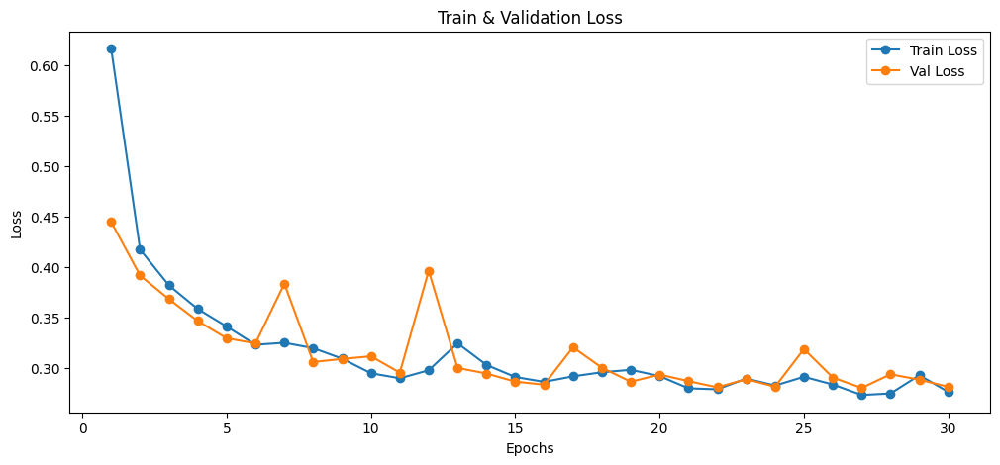

<ipython-input-13-7a0a50ea0c7c>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


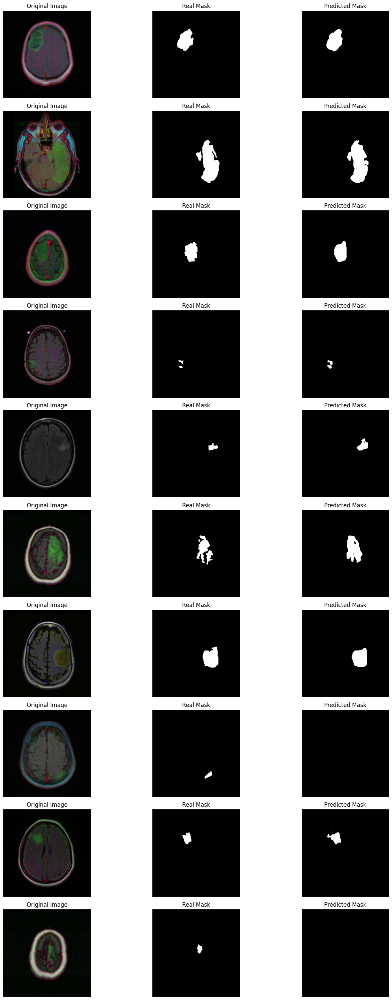

In [21]:

optimizer_deeplab = optim.Adam(deeplabv3_model.parameters(), lr=0.001)
train_model(deeplabv3_model, train_loader, val_loader, loss_fn_hy, optimizer_deeplab, scheduler_hy, num_epochs = Config.num_epochs, model_path="best_model_deeplab.pth", csv_name="training_results_deeplab.csv")
plot_losses(train_losses, val_losses)
inference_and_visualize(deeplabv3_model, test_loader, num_samples=10, device=device, model_path="/kaggle/working/best_model_deeplab.pth")

# **11 - Ensembling**

In [22]:

unet_model.load_state_dict(torch.load("/kaggle/working/best_model_unet.pth", map_location=device))
deeplabv3_model.load_state_dict(torch.load("/kaggle/working/best_model_deeplab.pth", map_location=device))


unet_model.to(device).eval()
deeplabv3_model.to(device).eval()


stacked_predictions = []
ground_truths = []


for images, masks in train_loader:
    images, masks = images.to(device), masks.to(device)

    preds = []
    with torch.no_grad():
        preds.append(torch.sigmoid(unet_model(images)).cpu().numpy())  
        preds.append(torch.sigmoid(deeplabv3_model(images)).cpu().numpy())  

    # Concatenate predictions along channel dimension
    stacked_output = np.concatenate(preds, axis=1)

    stacked_predictions.append(stacked_output)
    ground_truths.append(masks.cpu().numpy())

# Convert lists to numpy arrays
X_train = np.concatenate(stacked_predictions, axis=0)
y_train = np.concatenate(ground_truths, axis=0)

<ipython-input-22-fd7f71282b2a>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  unet_model.load_state_dict(torch.load("/kaggle/working/best_model_unet.pth", map_location=de

In [23]:
import torch
import torch.nn as nn
import segmentation_models_pytorch as smp  


unet_plus_plus_model = smp.UnetPlusPlus(
    encoder_name="resnet34",  
    encoder_weights="imagenet",  
    in_channels=2,  
    classes=1, 
    activation=None  
).to(device)

In [24]:
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)  # (batch_size, 3, 256, 256)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32)  # (batch_size, 1, 256, 256)

train_size = int(0.85 * len(X_train_tensor))
val_size = len(X_train_tensor) - train_size

train_dataset, val_dataset = random_split(TensorDataset(X_train_tensor, y_train_tensor), [train_size, val_size])

new_train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
new_val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)

loss_fn = nn.BCEWithLogitsLoss()  
optimizer = optim.Adam(unet_plus_plus_model.parameters(), lr=0.005)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 1/30 - Train Loss: 0.0213 -Train Dice: 0.9184 - Train mIoU:0.8894 -Train Recall: 0.2722 - Train Precision:0.2915


Epoch 1:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 1/30 - Val Loss: 0.0042 -Val Dice: 0.9378 - Val mIoU:0.9134 -Val Recall: 0.2487 - Val Precision:0.2782
Model saved at epoch 1 with dice: 0.9378


Epoch 2:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 2/30 - Train Loss: 0.0054 -Train Dice: 0.9344 - Train mIoU:0.9075 -Train Recall: 0.2779 - Train Precision:0.3029


Epoch 2:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 2/30 - Val Loss: 0.0041 -Val Dice: 0.9346 - Val mIoU:0.9101 -Val Recall: 0.2486 - Val Precision:0.2787


Epoch 3:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 3/30 - Train Loss: 0.0050 -Train Dice: 0.9358 - Train mIoU:0.9099 -Train Recall: 0.2780 - Train Precision:0.3032


Epoch 3:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 3/30 - Val Loss: 0.0041 -Val Dice: 0.9437 - Val mIoU:0.9221 -Val Recall: 0.2601 - Val Precision:0.2719
Model saved at epoch 3 with dice: 0.9437


Epoch 4:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 4/30 - Train Loss: 0.0050 -Train Dice: 0.9351 - Train mIoU:0.9091 -Train Recall: 0.2772 - Train Precision:0.3015


Epoch 4:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 4/30 - Val Loss: 0.0040 -Val Dice: 0.9405 - Val mIoU:0.9177 -Val Recall: 0.2505 - Val Precision:0.2771


Epoch 5:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 5/30 - Train Loss: 0.0049 -Train Dice: 0.9346 - Train mIoU:0.9086 -Train Recall: 0.2755 - Train Precision:0.3028


Epoch 5:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 5/30 - Val Loss: 0.0105 -Val Dice: 0.9462 - Val mIoU:0.9242 -Val Recall: 0.2682 - Val Precision:0.2682
Model saved at epoch 5 with dice: 0.9462


Epoch 6:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 6/30 - Train Loss: 0.0049 -Train Dice: 0.9369 - Train mIoU:0.9112 -Train Recall: 0.2783 - Train Precision:0.3023


Epoch 6:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 6/30 - Val Loss: 0.0043 -Val Dice: 0.9338 - Val mIoU:0.9097 -Val Recall: 0.2386 - Val Precision:0.2810


Epoch 7:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 7/30 - Train Loss: 0.0048 -Train Dice: 0.9378 - Train mIoU:0.9124 -Train Recall: 0.2776 - Train Precision:0.3025


Epoch 7:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 7/30 - Val Loss: 0.0038 -Val Dice: 0.9412 - Val mIoU:0.9186 -Val Recall: 0.2515 - Val Precision:0.2771


Epoch 8:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 8/30 - Train Loss: 0.0053 -Train Dice: 0.9334 - Train mIoU:0.9083 -Train Recall: 0.2757 - Train Precision:0.2981


Epoch 8:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 8/30 - Val Loss: 0.0772 -Val Dice: 0.8766 - Val mIoU:0.8311 -Val Recall: 0.2970 - Val Precision:0.1564


Epoch 9:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 9/30 - Train Loss: 0.0065 -Train Dice: 0.9256 - Train mIoU:0.8989 -Train Recall: 0.2757 - Train Precision:0.2925


Epoch 9:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 9/30 - Val Loss: 0.0041 -Val Dice: 0.9427 - Val mIoU:0.9201 -Val Recall: 0.2545 - Val Precision:0.2775


Epoch 10:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 10/30 - Train Loss: 0.0050 -Train Dice: 0.9376 - Train mIoU:0.9116 -Train Recall: 0.2785 - Train Precision:0.3014


Epoch 10:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 10/30 - Val Loss: 0.0039 -Val Dice: 0.9386 - Val mIoU:0.9169 -Val Recall: 0.2508 - Val Precision:0.2759


Epoch 11:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 11/30 - Train Loss: 0.0049 -Train Dice: 0.9380 - Train mIoU:0.9123 -Train Recall: 0.2780 - Train Precision:0.3031


Epoch 11:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 11/30 - Val Loss: 0.0039 -Val Dice: 0.9422 - Val mIoU:0.9195 -Val Recall: 0.2530 - Val Precision:0.2762


Epoch 12:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 12/30 - Train Loss: 0.0048 -Train Dice: 0.9377 - Train mIoU:0.9120 -Train Recall: 0.2777 - Train Precision:0.3027


Epoch 12:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 12/30 - Val Loss: 0.0039 -Val Dice: 0.9376 - Val mIoU:0.9144 -Val Recall: 0.2451 - Val Precision:0.2785


Epoch 13:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 13/30 - Train Loss: 0.0048 -Train Dice: 0.9383 - Train mIoU:0.9130 -Train Recall: 0.2780 - Train Precision:0.3030


Epoch 13:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 13/30 - Val Loss: 0.0039 -Val Dice: 0.9383 - Val mIoU:0.9158 -Val Recall: 0.2475 - Val Precision:0.2776


Epoch 14:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 14/30 - Train Loss: 0.0047 -Train Dice: 0.9381 - Train mIoU:0.9128 -Train Recall: 0.2780 - Train Precision:0.3025


Epoch 14:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 14/30 - Val Loss: 0.0038 -Val Dice: 0.9395 - Val mIoU:0.9167 -Val Recall: 0.2485 - Val Precision:0.2780


Epoch 15:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 15/30 - Train Loss: 0.0047 -Train Dice: 0.9389 - Train mIoU:0.9137 -Train Recall: 0.2785 - Train Precision:0.3031


Epoch 15:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 15/30 - Val Loss: 0.0037 -Val Dice: 0.9407 - Val mIoU:0.9187 -Val Recall: 0.2522 - Val Precision:0.2763


Epoch 16:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 16/30 - Train Loss: 0.0047 -Train Dice: 0.9385 - Train mIoU:0.9133 -Train Recall: 0.2783 - Train Precision:0.3027


Epoch 16:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 16/30 - Val Loss: 0.0038 -Val Dice: 0.9393 - Val mIoU:0.9172 -Val Recall: 0.2496 - Val Precision:0.2776


Epoch 17:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 17/30 - Train Loss: 0.0047 -Train Dice: 0.9379 - Train mIoU:0.9126 -Train Recall: 0.2785 - Train Precision:0.3025


Epoch 17:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 17/30 - Val Loss: 0.0042 -Val Dice: 0.9414 - Val mIoU:0.9190 -Val Recall: 0.2526 - Val Precision:0.2761


Epoch 18:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 18/30 - Train Loss: 0.0046 -Train Dice: 0.9386 - Train mIoU:0.9136 -Train Recall: 0.2784 - Train Precision:0.3019


Epoch 18:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 18/30 - Val Loss: 0.0040 -Val Dice: 0.9385 - Val mIoU:0.9164 -Val Recall: 0.2489 - Val Precision:0.2777


Epoch 19:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 19/30 - Train Loss: 0.0046 -Train Dice: 0.9379 - Train mIoU:0.9127 -Train Recall: 0.2779 - Train Precision:0.3034


Epoch 19:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 19/30 - Val Loss: 0.0056 -Val Dice: 0.9375 - Val mIoU:0.9158 -Val Recall: 0.2482 - Val Precision:0.2779


Epoch 20:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 20/30 - Train Loss: 0.0045 -Train Dice: 0.9376 - Train mIoU:0.9127 -Train Recall: 0.2775 - Train Precision:0.3029


Epoch 20:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 20/30 - Val Loss: 0.0038 -Val Dice: 0.9420 - Val mIoU:0.9199 -Val Recall: 0.2536 - Val Precision:0.2763


Epoch 21:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 21/30 - Train Loss: 0.0045 -Train Dice: 0.9386 - Train mIoU:0.9136 -Train Recall: 0.2783 - Train Precision:0.3027


Epoch 21:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 21/30 - Val Loss: 0.0070 -Val Dice: 0.9395 - Val mIoU:0.9172 -Val Recall: 0.2493 - Val Precision:0.2779


Epoch 22:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 22/30 - Train Loss: 0.0045 -Train Dice: 0.9386 - Train mIoU:0.9136 -Train Recall: 0.2786 - Train Precision:0.3035


Epoch 22:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 22/30 - Val Loss: 0.0066 -Val Dice: 0.9382 - Val mIoU:0.9154 -Val Recall: 0.2461 - Val Precision:0.2794


Epoch 23:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 23/30 - Train Loss: 0.0045 -Train Dice: 0.9385 - Train mIoU:0.9134 -Train Recall: 0.2781 - Train Precision:0.3034


Epoch 23:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 23/30 - Val Loss: 0.0038 -Val Dice: 0.9420 - Val mIoU:0.9200 -Val Recall: 0.2540 - Val Precision:0.2761


Epoch 24:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 24/30 - Train Loss: 0.0045 -Train Dice: 0.9381 - Train mIoU:0.9131 -Train Recall: 0.2781 - Train Precision:0.3035


Epoch 24:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 24/30 - Val Loss: 0.0038 -Val Dice: 0.9408 - Val mIoU:0.9187 -Val Recall: 0.2518 - Val Precision:0.2769


Epoch 25:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 25/30 - Train Loss: 0.0045 -Train Dice: 0.9392 - Train mIoU:0.9141 -Train Recall: 0.2787 - Train Precision:0.3037


Epoch 25:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 25/30 - Val Loss: 0.0038 -Val Dice: 0.9424 - Val mIoU:0.9204 -Val Recall: 0.2546 - Val Precision:0.2779


Epoch 26:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 26/30 - Train Loss: 0.0045 -Train Dice: 0.9381 - Train mIoU:0.9132 -Train Recall: 0.2780 - Train Precision:0.3041


Epoch 26:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 26/30 - Val Loss: 0.0046 -Val Dice: 0.9407 - Val mIoU:0.9183 -Val Recall: 0.2509 - Val Precision:0.2796


Epoch 27:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 27/30 - Train Loss: 0.0044 -Train Dice: 0.9390 - Train mIoU:0.9138 -Train Recall: 0.2783 - Train Precision:0.3043


Epoch 27:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 27/30 - Val Loss: 0.0039 -Val Dice: 0.9436 - Val mIoU:0.9213 -Val Recall: 0.2555 - Val Precision:0.2779


Epoch 28:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 28/30 - Train Loss: 0.0044 -Train Dice: 0.9385 - Train mIoU:0.9134 -Train Recall: 0.2780 - Train Precision:0.3045


Epoch 28:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 28/30 - Val Loss: 0.0039 -Val Dice: 0.9386 - Val mIoU:0.9156 -Val Recall: 0.2465 - Val Precision:0.2812


Epoch 29:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 29/30 - Train Loss: 0.0044 -Train Dice: 0.9387 - Train mIoU:0.9134 -Train Recall: 0.2784 - Train Precision:0.3051


Epoch 29:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 29/30 - Val Loss: 0.0039 -Val Dice: 0.9451 - Val mIoU:0.9229 -Val Recall: 0.2583 - Val Precision:0.2762


Epoch 30:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 30/30 - Train Loss: 0.0044 -Train Dice: 0.9391 - Train mIoU:0.9140 -Train Recall: 0.2793 - Train Precision:0.3049


Epoch 30:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 30/30 - Val Loss: 0.0039 -Val Dice: 0.9423 - Val mIoU:0.9198 -Val Recall: 0.2528 - Val Precision:0.2792
Training Complete in 1134.7718s with 37.8257s per epoch with Best_dice 0.9462.


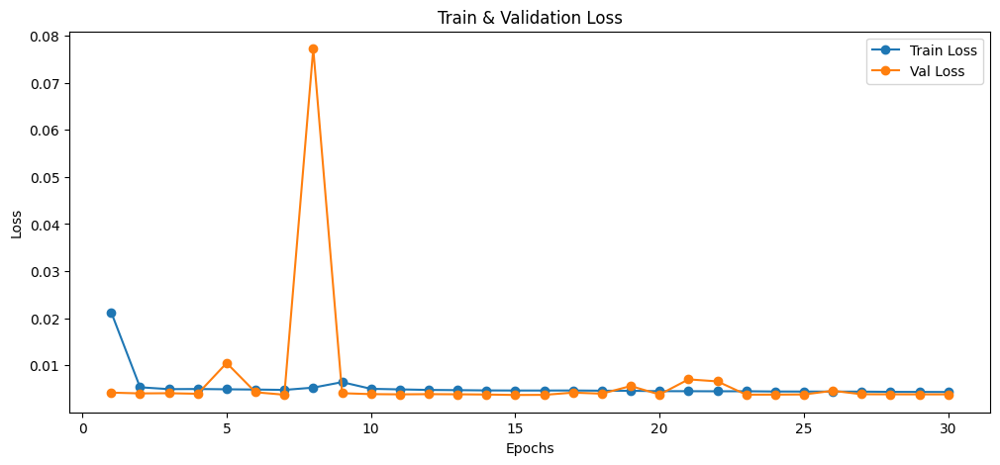

<ipython-input-13-7a0a50ea0c7c>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


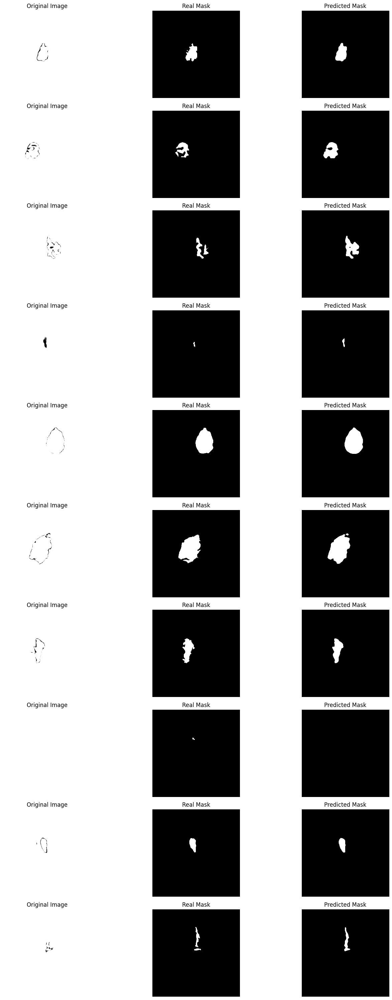

In [25]:

train_model(unet_plus_plus_model, new_train_loader, new_val_loader, loss_fn, optimizer, scheduler, num_epochs = Config.num_epochs, model_path="best_model_unetpp1.pth", csv_name="training_results_unetpp.csv")
plot_losses(train_losses, val_losses)
inference_and_visualize(unet_plus_plus_model, new_train_loader, num_samples=10, device=device, model_path="/kaggle/working/best_model_unetpp1.pth")

Epoch 1:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 1/30 - Train Loss: 0.2673 -Train Dice: 0.9416 - Train mIoU:0.9168 -Train Recall: 0.2905 - Train Precision:0.2981


Epoch 1:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 1/30 - Val Loss: 0.2704 -Val Dice: 0.9491 - Val mIoU:0.9276 -Val Recall: 0.2695 - Val Precision:0.2703
Model saved at epoch 1 with dice: 0.9491


Epoch 2:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 2/30 - Train Loss: 0.2664 -Train Dice: 0.9425 - Train mIoU:0.9182 -Train Recall: 0.2913 - Train Precision:0.2980


Epoch 2:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 2/30 - Val Loss: 0.2705 -Val Dice: 0.9484 - Val mIoU:0.9268 -Val Recall: 0.2664 - Val Precision:0.2724


Epoch 3:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 3/30 - Train Loss: 0.2705 -Train Dice: 0.9371 - Train mIoU:0.9127 -Train Recall: 0.2921 - Train Precision:0.2982


Epoch 3:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 3/30 - Val Loss: 0.2721 -Val Dice: 0.9446 - Val mIoU:0.9231 -Val Recall: 0.2604 - Val Precision:0.2728


Epoch 4:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 4/30 - Train Loss: 0.2661 -Train Dice: 0.9429 - Train mIoU:0.9187 -Train Recall: 0.2923 - Train Precision:0.2974


Epoch 4:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 4/30 - Val Loss: 0.2707 -Val Dice: 0.9473 - Val mIoU:0.9257 -Val Recall: 0.2653 - Val Precision:0.2725


Epoch 5:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 5/30 - Train Loss: 0.2693 -Train Dice: 0.9414 - Train mIoU:0.9171 -Train Recall: 0.2930 - Train Precision:0.2975


Epoch 5:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 5/30 - Val Loss: 0.2703 -Val Dice: 0.9484 - Val mIoU:0.9268 -Val Recall: 0.2683 - Val Precision:0.2706


Epoch 6:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 6/30 - Train Loss: 0.2649 -Train Dice: 0.9434 - Train mIoU:0.9191 -Train Recall: 0.2935 - Train Precision:0.2977


Epoch 6:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 6/30 - Val Loss: 0.2712 -Val Dice: 0.9459 - Val mIoU:0.9244 -Val Recall: 0.2637 - Val Precision:0.2730


Epoch 7:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 7/30 - Train Loss: 0.2663 -Train Dice: 0.9433 - Train mIoU:0.9192 -Train Recall: 0.2930 - Train Precision:0.2969


Epoch 7:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 7/30 - Val Loss: 0.2709 -Val Dice: 0.9470 - Val mIoU:0.9254 -Val Recall: 0.2670 - Val Precision:0.2706


Epoch 8:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 8/30 - Train Loss: 0.2669 -Train Dice: 0.9432 - Train mIoU:0.9191 -Train Recall: 0.2936 - Train Precision:0.2969


Epoch 8:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 8/30 - Val Loss: 0.2704 -Val Dice: 0.9482 - Val mIoU:0.9266 -Val Recall: 0.2673 - Val Precision:0.2712


Epoch 9:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 9/30 - Train Loss: 0.2638 -Train Dice: 0.9437 - Train mIoU:0.9195 -Train Recall: 0.2934 - Train Precision:0.2971


Epoch 9:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 9/30 - Val Loss: 0.2708 -Val Dice: 0.9467 - Val mIoU:0.9252 -Val Recall: 0.2654 - Val Precision:0.2719


Epoch 10:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 10/30 - Train Loss: 0.2636 -Train Dice: 0.9428 - Train mIoU:0.9188 -Train Recall: 0.2939 - Train Precision:0.2967


Epoch 10:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 10/30 - Val Loss: 0.2705 -Val Dice: 0.9475 - Val mIoU:0.9259 -Val Recall: 0.2664 - Val Precision:0.2714


Epoch 11:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 11/30 - Train Loss: 0.2641 -Train Dice: 0.9438 - Train mIoU:0.9197 -Train Recall: 0.2941 - Train Precision:0.2969


Epoch 11:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 11/30 - Val Loss: 0.2707 -Val Dice: 0.9472 - Val mIoU:0.9256 -Val Recall: 0.2655 - Val Precision:0.2720


Epoch 12:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 12/30 - Train Loss: 0.2695 -Train Dice: 0.9435 - Train mIoU:0.9194 -Train Recall: 0.2937 - Train Precision:0.2973


Epoch 12:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 12/30 - Val Loss: 0.2704 -Val Dice: 0.9478 - Val mIoU:0.9262 -Val Recall: 0.2669 - Val Precision:0.2713


Epoch 13:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 13/30 - Train Loss: 0.2668 -Train Dice: 0.9433 - Train mIoU:0.9192 -Train Recall: 0.2943 - Train Precision:0.2967


Epoch 13:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 13/30 - Val Loss: 0.2704 -Val Dice: 0.9458 - Val mIoU:0.9242 -Val Recall: 0.2666 - Val Precision:0.2716


Epoch 14:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 14/30 - Train Loss: 0.2701 -Train Dice: 0.9439 - Train mIoU:0.9198 -Train Recall: 0.2943 - Train Precision:0.2964


Epoch 14:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 14/30 - Val Loss: 0.2704 -Val Dice: 0.9477 - Val mIoU:0.9261 -Val Recall: 0.2666 - Val Precision:0.2714


Epoch 15:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 15/30 - Train Loss: 0.2641 -Train Dice: 0.9436 - Train mIoU:0.9196 -Train Recall: 0.2942 - Train Precision:0.2974


Epoch 15:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 15/30 - Val Loss: 0.2704 -Val Dice: 0.9476 - Val mIoU:0.9261 -Val Recall: 0.2672 - Val Precision:0.2709


Epoch 16:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 16/30 - Train Loss: 0.2640 -Train Dice: 0.9438 - Train mIoU:0.9198 -Train Recall: 0.2941 - Train Precision:0.2965


Epoch 16:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 16/30 - Val Loss: 0.2704 -Val Dice: 0.9477 - Val mIoU:0.9261 -Val Recall: 0.2670 - Val Precision:0.2711


Epoch 17:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 17/30 - Train Loss: 0.2661 -Train Dice: 0.9436 - Train mIoU:0.9196 -Train Recall: 0.2942 - Train Precision:0.2974


Epoch 17:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 17/30 - Val Loss: 0.2703 -Val Dice: 0.9479 - Val mIoU:0.9263 -Val Recall: 0.2668 - Val Precision:0.2714


Epoch 18:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 18/30 - Train Loss: 0.2638 -Train Dice: 0.9440 - Train mIoU:0.9200 -Train Recall: 0.2943 - Train Precision:0.2974


Epoch 18:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 18/30 - Val Loss: 0.2703 -Val Dice: 0.9479 - Val mIoU:0.9263 -Val Recall: 0.2671 - Val Precision:0.2712


Epoch 19:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 19/30 - Train Loss: 0.2669 -Train Dice: 0.9440 - Train mIoU:0.9199 -Train Recall: 0.2948 - Train Precision:0.2968


Epoch 19:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 19/30 - Val Loss: 0.2704 -Val Dice: 0.9476 - Val mIoU:0.9260 -Val Recall: 0.2664 - Val Precision:0.2715


Epoch 20:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 20/30 - Train Loss: 0.2657 -Train Dice: 0.9444 - Train mIoU:0.9203 -Train Recall: 0.2945 - Train Precision:0.2970


Epoch 20:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 20/30 - Val Loss: 0.2706 -Val Dice: 0.9472 - Val mIoU:0.9256 -Val Recall: 0.2659 - Val Precision:0.2715


Epoch 21:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 21/30 - Train Loss: 0.2644 -Train Dice: 0.9436 - Train mIoU:0.9196 -Train Recall: 0.2946 - Train Precision:0.2964


Epoch 21:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 21/30 - Val Loss: 0.2704 -Val Dice: 0.9476 - Val mIoU:0.9260 -Val Recall: 0.2667 - Val Precision:0.2713


Epoch 22:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 22/30 - Train Loss: 0.2647 -Train Dice: 0.9442 - Train mIoU:0.9201 -Train Recall: 0.2947 - Train Precision:0.2967


Epoch 22:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 22/30 - Val Loss: 0.2704 -Val Dice: 0.9475 - Val mIoU:0.9259 -Val Recall: 0.2664 - Val Precision:0.2715


Epoch 23:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 23/30 - Train Loss: 0.2642 -Train Dice: 0.9436 - Train mIoU:0.9196 -Train Recall: 0.2943 - Train Precision:0.2966


Epoch 23:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 23/30 - Val Loss: 0.2704 -Val Dice: 0.9475 - Val mIoU:0.9259 -Val Recall: 0.2664 - Val Precision:0.2715


Epoch 24:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 24/30 - Train Loss: 0.2673 -Train Dice: 0.9442 - Train mIoU:0.9202 -Train Recall: 0.2946 - Train Precision:0.2969


Epoch 24:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 24/30 - Val Loss: 0.2703 -Val Dice: 0.9479 - Val mIoU:0.9263 -Val Recall: 0.2672 - Val Precision:0.2711


Epoch 25:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 25/30 - Train Loss: 0.2660 -Train Dice: 0.9442 - Train mIoU:0.9201 -Train Recall: 0.2947 - Train Precision:0.2963


Epoch 25:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 25/30 - Val Loss: 0.2704 -Val Dice: 0.9476 - Val mIoU:0.9261 -Val Recall: 0.2667 - Val Precision:0.2713


Epoch 26:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 26/30 - Train Loss: 0.2645 -Train Dice: 0.9439 - Train mIoU:0.9200 -Train Recall: 0.2945 - Train Precision:0.2965


Epoch 26:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 26/30 - Val Loss: 0.2704 -Val Dice: 0.9477 - Val mIoU:0.9261 -Val Recall: 0.2668 - Val Precision:0.2713


Epoch 27:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 27/30 - Train Loss: 0.2658 -Train Dice: 0.9445 - Train mIoU:0.9204 -Train Recall: 0.2945 - Train Precision:0.2964


Epoch 27:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 27/30 - Val Loss: 0.2704 -Val Dice: 0.9476 - Val mIoU:0.9260 -Val Recall: 0.2667 - Val Precision:0.2713


Epoch 28:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 28/30 - Train Loss: 0.2729 -Train Dice: 0.9441 - Train mIoU:0.9200 -Train Recall: 0.2946 - Train Precision:0.2969


Epoch 28:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 28/30 - Val Loss: 0.2703 -Val Dice: 0.9478 - Val mIoU:0.9263 -Val Recall: 0.2671 - Val Precision:0.2711


Epoch 29:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 29/30 - Train Loss: 0.2635 -Train Dice: 0.9438 - Train mIoU:0.9198 -Train Recall: 0.2947 - Train Precision:0.2969


Epoch 29:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 29/30 - Val Loss: 0.2705 -Val Dice: 0.9475 - Val mIoU:0.9259 -Val Recall: 0.2665 - Val Precision:0.2713


Epoch 30:   0%|          | 0/167 [00:00<?, ?it/s]

Epoch 30/30 - Train Loss: 0.2647 -Train Dice: 0.9441 - Train mIoU:0.9200 -Train Recall: 0.2947 - Train Precision:0.2967


Epoch 30:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch 30/30 - Val Loss: 0.2704 -Val Dice: 0.9477 - Val mIoU:0.9261 -Val Recall: 0.2668 - Val Precision:0.2712
Training Complete in 1135.6636s with 37.8555s per epoch with Best_dice 0.9491.


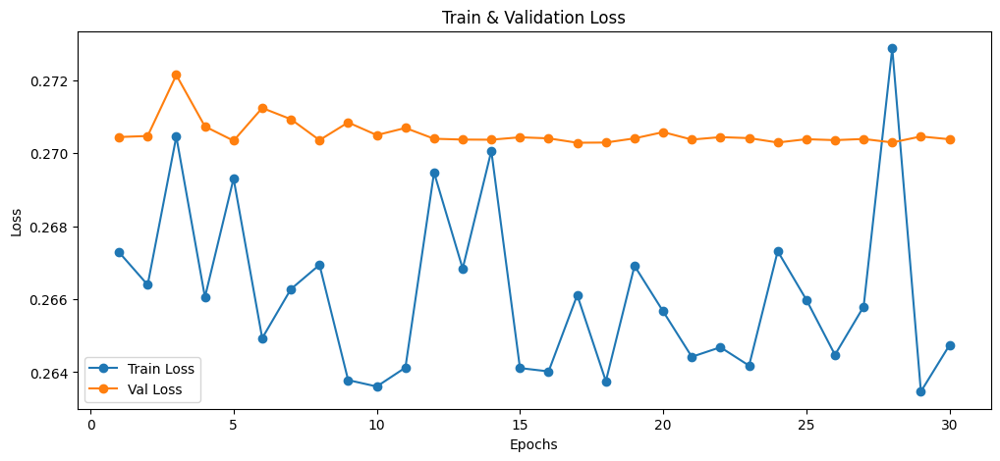

<ipython-input-13-7a0a50ea0c7c>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


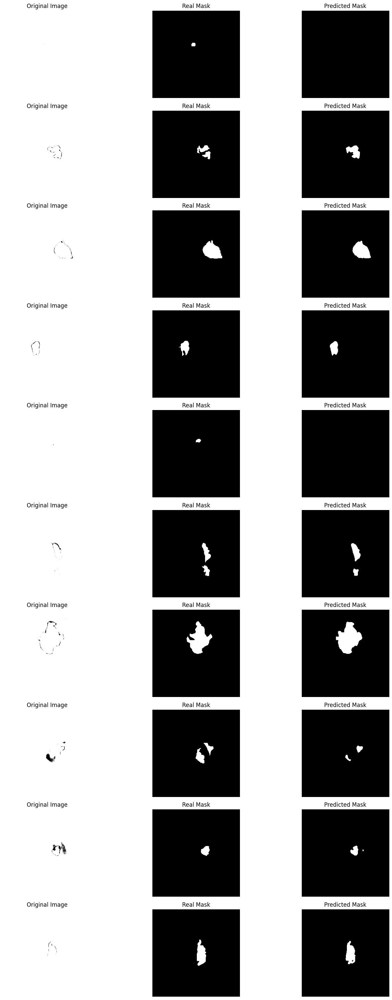

In [26]:
train_model(unet_plus_plus_model, new_train_loader, new_val_loader, loss_fn_hy, optimizer, scheduler, num_epochs = Config.num_epochs, model_path="best_model_unetpp2.pth", csv_name="training_results_unetpp2.csv")
plot_losses(train_losses, val_losses)
inference_and_visualize(unet_plus_plus_model, new_train_loader, num_samples=10, device=device, model_path="/kaggle/working/best_model_unetpp2.pth")